# <b>1 <span style='color:#0000FF'>|</span> Introduction</b>

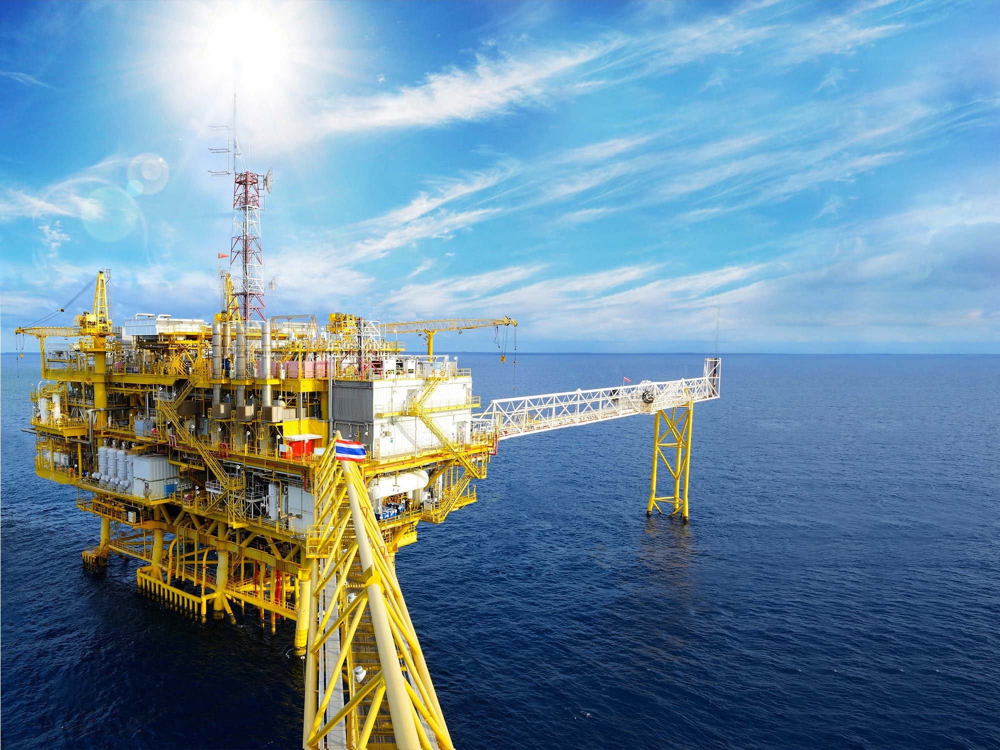

# Drilling Parameters Reference

<div align="center">

| **Variable**   | **Description** |
|----------------|-----------------|
| **DEPT**       | Measured Depth (MD) of the wellbore |
| **MTTVD**      | True Vertical Depth (TVD) measured from the surface |
| **ROP**        | Rate of Penetration – drilling speed |
| **KPOSI**      | Kelly Position – position of the kelly on rotary table |
| **SSS_H**      | Stick Slip Severity (High) |
| **SSL_H**      | Stick Slip Level (High) |
| **RPM_H**      | Rotations per Minute – high-resolution sensor value |
| **VIBC**       | Vibration Count – downhole vibrations |
| **VIBXYH**     | Horizontal Vibration (X-Y axis) |
| **VIBZH**      | Vertical Vibration (Z axis) |
| **SPP I**      | Standpipe Pressure Indicator |
| **Depth (m)**  | Drilled Depth in meters |
| **ROP1 (m/hr)**| Rate of Penetration in meters per hour |
| **ROP2 (min/mt)** | Rate of Penetration in minutes per meter |
| **WOB**        | Weight on Bit – downward force applied to bit |
| **RPM**        | Rotations per Minute – rotary speed |
| **Torque**     | Rotational force applied to drill string |
| **SPP**        | Standpipe Pressure – circulating pressure |
| **SPM1**       | Strokes Per Minute – pump 1 |
| **SPM2**       | Strokes Per Minute – pump 2 |
| **Flow in**    | Flow rate of drilling fluid into the well |
| **M.Temp in**  | Mud Temperature entering the system |
| **M.Temp out** | Mud Temperature returning from the well |
| **M.Wt in**    | Mud Weight at inlet (ppg / SG) |
| **M.Wt out**   | Mud Weight at outlet (ppg / SG) |
| **DEPT.M**     | MWD Tool Measurement Depth |
| **BDEP.M**     | Bit Depth – actual depth of drill bit |
| **KPOSI.M**    | Kelly Position (Raw sensor reading) |
| **HKL.KLBF**   | Hook Load in Kilo-Pounds Force (klbf) |
| **SPP.PSI**    | Standpipe Pressure (psi) |
| **ROP.M/HR**   | Rate of Penetration averaged by MWD depth (m/hr) |
| **PSPD.M/MIN** | Pipe Speed – instantaneous tripping speed (m/min) |
| **VIBC.CPS**   | Vibration Count per second |
| **SSL_H.**     | Stick Slip Level (from HDS1 sensor) |
| **SSS_H.**     | Stick Slip Severity Percentage (from HDS1) |
| **RPM_H.**     | Average RPM (from HDS1) |
| **VIBXYH.**    | Lateral Vibration (X-Y axis) |
| **VIBZH.**     | Axial Vibration (Z axis) |

</div>


# <b>2 <span style='color:#0000FF'>|</span> Importing libraries</b>

In [19]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno      ## for missing values
import tqdm
#from ydata_profiling  import ProfileReport
from sklearn.preprocessing import StandardScaler 
from sklearn.model_selection import train_test_split
# from datasist.structdata import detect_outliers
from IPython.display import Markdown, display

# data modeling 
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor,plot_tree
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import cross_validate
import joblib


import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
sns.set(rc={'figure.figsize': [10, 6]}, font_scale=1.3)
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows",None)


# <b>3 <span style='color:#0000FF'>|</span> Reading the dataset</b>

In [ ]:
def read_and_merge_excel_sheets(file_path):
    # Read all sheets into a dictionary of DataFrames
    all_sheets = pd.read_excel(file_path, sheet_name=None, skiprows=0)

    # Concatenate all DataFrames into a single DataFrame
    merged_df = pd.concat((df.assign(SheetName=sheet_name) for sheet_name, df in all_sheets.items()), ignore_index=True)

    return merged_df

# Example usage:
excel_file_path = r"E:\Tamino Integration\Vibrations Detection\All_Collected_Data.xlsx"
df = read_and_merge_excel_sheets(excel_file_path)

In [4]:
df.head()

,DEPT,KPOSI,SPP,ROP,PSPD,VIBC,SSL_H,SSS_H,RPM_H,VIBXYH,VIBZH,Depth (m),ROP1 (m/hr),ROP2 (min/mt),WOB,RPM,Torque,SPM1,SPM2,Flow in,M.Temp in,M.Temp out,M.Wt in,M.Wt out,SheetName
0,50.0,5.51,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,BED 18-16
1,50.0,5.57,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,BED 18-16
2,50.0,6.28,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,BED 18-16
3,50.0,6.28,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,BED 18-16
4,50.0,6.31,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,BED 18-16


In [6]:
well_Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 188806 entries, 0 to 188805
Data columns (total 25 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   DEPT             188806 non-null  float64
 1   KPOSI            167250 non-null  float64
 2   SPP              177891 non-null  float64
 3   ROP              48213 non-null   float64
 4   PSPD             77009 non-null   float64
 5   VIBC             32122 non-null   float64
 6   SSL_H            34818 non-null   float64
 7   SSS_H            34818 non-null   float64
 8   RPM_H            33115 non-null   float64
 9   VIBXYH           34414 non-null   float64
 10  VIBZH            42011 non-null   float64
 11  Depth (m)        177860 non-null  float64
 12    ROP1   (m/hr)  177860 non-null  float64
 13  ROP2 (min/mt)    177860 non-null  float64
 14  WOB              177860 non-null  float64
 15  RPM              177860 non-null  float64
 16  Torque           177860 non-null  floa

<p style="color:#0099e6;font-size:25px;font-family:Georgia;text-align:center;">Takeaway <strong style="color:#fd1c20;font-size:25px;font-family:Georgia;">Points </strong></p>


<p style= "font-family:Georgia;color:#000000;font-size:110%;text-align:center;border-radius:10px 10px;border-style: solid;border-width:5px;border-color:#fbff00;"><br>
Number of variables = 20 <br>
Number of rows = 1771<br>
Number of categorical type of feature = 0<br>
Number of numerical type of feature = 20 <br>
<br></p>

In [71]:
well_Data.describe().T.style.set_properties(**{'background-color': '#FFFF99','color': 'black','border-color': 'white'})

,count,mean,std,min,25%,50%,75%,max
DEPT,188806.000000,1946.248512,1205.559106,-3131.000000,1694.240000,2109.360000,2731.510000,3306.200000
KPOSI,167250.000000,17.104304,15.630576,-31.350000,7.790000,16.650000,25.750000,100.330000
SPP,177891.000000,2222.605642,1129.615473,-3284.364000,2259.823000,2465.626000,2638.591000,3361.990000
ROP,48213.000000,39.949732,66.188042,-1121.630000,15.340000,38.130000,58.670000,3642.190000
PSPD,77009.000000,-0.368012,6.941097,-65.640000,-0.430000,-0.010000,0.000000,65.670000
VIBC,32122.000000,24.072453,115.312214,-493.510000,-20.000000,8.170000,38.000000,510.000000
SSL_H,34818.000000,0.532380,1.853733,-3.000000,0.000000,0.000000,2.000000,3.000000
SSS_H,34818.000000,27.174967,103.396106,-255.000000,8.162500,29.770000,95.717500,864.020000
RPM_H,33115.000000,56.205706,81.573110,-422.000000,62.000000,89.230000,100.000000,498.000000
VIBXYH,34414.000000,1.620065,3.458051,-21.000000,0.000000,2.000000,2.410000,21.000000


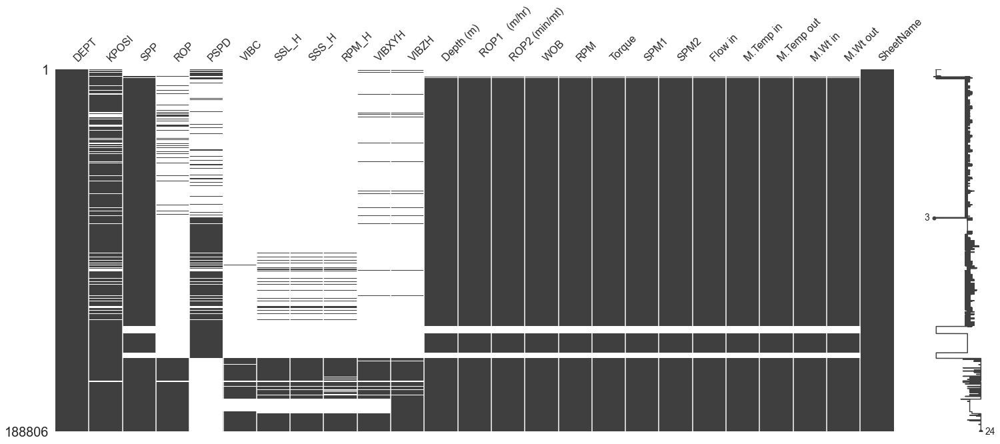

In [73]:
msno.matrix(well_Data)
plt.show()

In [6]:
well_Data.duplicated().sum()

9423

# <b><span style='color:#0000FF'>|</span> Data Cleansing</b>

In [10]:
df.columns

Index(['DEPT', 'KPOSI', 'SPP', 'ROP', 'PSPD', 'VIBC', 'SSL_H', 'SSS_H',
       'RPM_H', 'VIBXYH', 'VIBZH', 'Depth (m)', '  ROP1   (m/hr)',
       'ROP2 (min/mt)', 'WOB', 'RPM', 'Torque', 'SPM1', 'SPM2', 'Flow in',
       'M.Temp in', 'M.Temp out', 'M.Wt in', 'M.Wt out', 'SheetName'],
      dtype='object')

In [7]:
# Remove Duplicates
well_Data.drop_duplicates(inplace=True)

# Columns to drop null values from
columns_to_drop_nulls = ['SSL_H','VIBXYH', 'VIBZH']

# Drop null values only in the specified columns
well_Data = well_Data.dropna(subset=columns_to_drop_nulls)

# Drop the 'PSPD' column
well_Data = well_Data.drop(columns=['PSPD','ROP','ROP2 (min/mt)','Depth (m)','RPM_H'])

In [8]:
well_Data.to_csv('clean.csv',index=False)

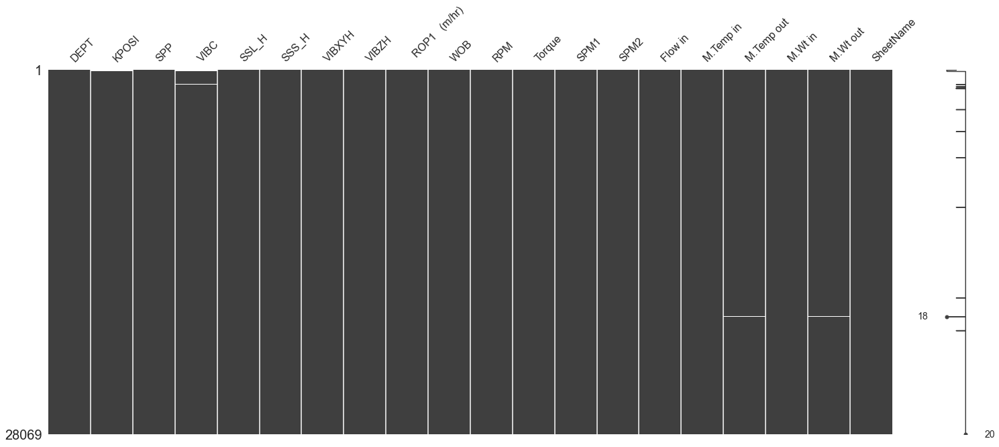

In [9]:
msno.matrix(well_Data)
plt.show()

# <b>4<span style='color:#0000FF'>|</span> Pandas Profiling </b>

### <span style="color: blue;">Generates profile reports from a pandas DataFrame.</span>
 - **for more information about pandas profile report check this** 
 **[Github | pandas profiling](https://github.com/ydataai/pandas-profiling)**

In [58]:
profile=ProfileReport(well_Data, minimal=True,explorative=True)
profile.to_file('Well analysis.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# <b>5 <span style='color:#0000FF'>|</span> Exploratory Data Analysis</b>

<div style="color:yellow;display:fill;border-radius:8px;
            background-color:#0000FF;font-size:150%;
            font-family:Nexa;letter-spacing:0.5px">
    <p style="padding: 8px
;color:white;"><b>5.1 | Target Features ['SSL_H','VIBXYH', 'VIBZH'] </b></p>
</div>

In [59]:
def analyze_column(dataframe, column_name):
    """
    Analyze a specific column in a DataFrame.

    Parameters:
    - dataframe (pd.DataFrame): The DataFrame containing the data.
    - column_name (str): The name of the column to analyze.

    Returns:
    - Descriptive statistics, distribution plot, boxplot, top values, and lowest values.
    """
    display(Markdown(f"<div style='text-align: center; color: black; background-color: yellow; border: 10px solid #404040; padding: 2px; border-radius: 10px;'><h1> {column_name} </h1></div>"))

    # Descriptive statistics
    descriptive_stats = dataframe[[column_name]].describe()

    # Top and lowest values
    top_values = dataframe.sort_values(column_name, ascending=False).reset_index().head(10)
    lowest_values = dataframe.sort_values(column_name, ascending=True).reset_index().head(10)

    # Display results using Markdown
    display(Markdown(f"<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1> Descriptive Statistics </h1></div>"))
    display(descriptive_stats)

    display(Markdown(f"<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1> {column_name} Distribution Plot and Boxplot </h1></div>"))
    
    # Distribution plot and boxplot
    fig, ax = plt.subplots(1, 2, figsize=(15, 8))
    sns.distplot(dataframe[column_name], ax=ax[0])
    sns.boxplot(data=dataframe, x=column_name, ax=ax[1])
    plt.show()

    display(Markdown(f"<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1> {column_name} Top Values </h1></div>"
))
    display(top_values)

    display(Markdown(f"<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1> {column_name} Lowest Values </h1></div>"
))
    display(lowest_values)

<div style='text-align: center; color: black; background-color: yellow; border: 10px solid #404040; padding: 2px; border-radius: 10px;'><h1> VIBC </h1></div>

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1> Descriptive Statistics </h1></div>

,VIBC
count,27851.000000
mean,27.483314
std,120.474588
min,-493.510000
25%,-23.435000
50%,10.140000
75%,49.790000
max,510.000000


<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1> VIBC Distribution Plot and Boxplot </h1></div>

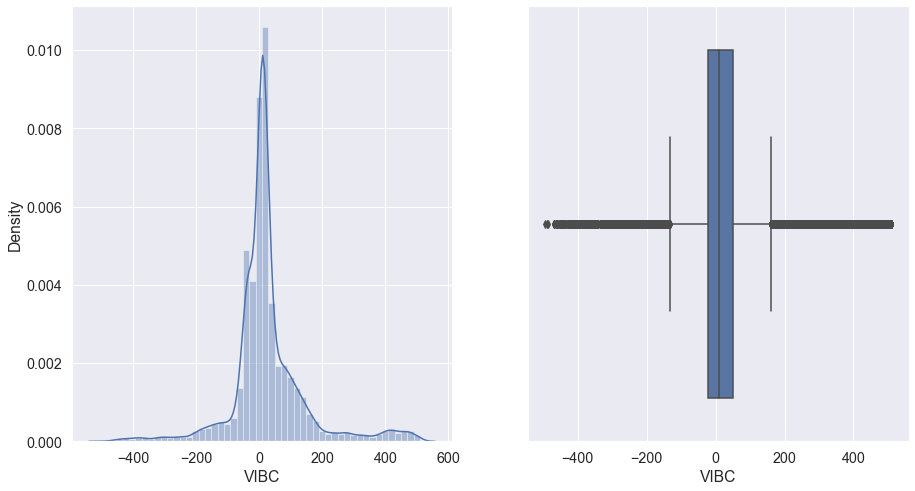

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1> VIBC Top Values </h1></div>

,index,DEPT,WOB,RPM,Flow in,Torque,SPP,ROP1 (m/hr),M.Wt in,M.Temp in,M.Temp out,VIBC,VIBXYH,VIBZH,SSS_H
0,21971,1748.2,32.11626,142.0665,787.0681,15005.710,2209.455,12.01879,9.2,46.89566,48.40886,510.0,10.83,4.00,10.15
1,21895,1733.0,31.18926,101.4385,780.6555,9948.571,2195.636,15.51354,9.2,46.14283,57.14032,510.0,7.25,4.00,9.00
2,21814,1716.8,42.23785,117.4735,698.5543,16825.600,1924.000,29.86689,9.2,46.42245,66.36620,510.0,19.49,8.21,8.00
3,21812,1716.4,42.23785,117.4735,698.5543,16825.600,1924.000,29.86689,9.2,46.42245,66.36620,510.0,16.75,6.50,10.34
4,21806,1715.2,32.46889,121.5042,693.9644,16782.400,1818.909,26.72546,9.2,46.39377,66.46919,510.0,12.39,6.07,10.00
5,21805,1715.0,32.46889,121.5042,693.9644,16782.400,1818.909,26.72546,9.2,46.39377,66.46919,510.0,10.79,6.50,10.00
6,21804,1714.8,26.68781,129.7262,695.6909,16830.400,1779.636,20.18477,9.2,46.35434,66.99379,510.0,11.18,6.50,12.77
7,21803,1714.6,26.68781,129.7262,695.6909,16830.400,1779.636,20.18477,9.2,46.35434,66.99379,510.0,13.76,6.50,15.54
8,21802,1714.4,26.68781,129.7262,695.6909,16830.400,1779.636,20.18477,9.2,46.35434,66.99379,510.0,16.34,6.50,18.31
9,21848,1723.6,42.82748,128.6893,692.5504,16604.800,1789.455,16.10606,9.2,46.49057,65.39908,510.0,14.38,6.50,21.65


<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1> VIBC Lowest Values </h1></div>

,index,DEPT,WOB,RPM,Flow in,Torque,SPP,ROP1 (m/hr),M.Wt in,M.Temp in,M.Temp out,VIBC,VIBXYH,VIBZH,SSS_H
0,14432,-2444.0,-33.65133,-131.91680,-640.2337,-16045.71,-1837.091,-16.61396,-9.1,-45.13396,-52.01178,-493.51,-6.63,-4.00,-14.04
1,12191,-1958.8,-37.88082,-82.19058,-690.2875,-8744.00,-2050.909,-14.85538,-9.1,-45.66981,-67.40575,-490.00,-14.50,-6.50,-7.00
2,14433,-2444.2,-33.65133,-131.91680,-640.2337,-16045.71,-1837.091,-16.61396,-9.1,-45.13396,-52.01178,-487.29,-6.97,-4.00,-14.14
3,11081,-1570.8,-25.13684,-112.31840,-796.3148,-13120.00,-2434.182,-16.31004,-9.0,-45.91698,-66.93104,-468.00,-15.70,-4.00,-15.24
4,11079,-1570.4,-25.13684,-112.31840,-796.3148,-13120.00,-2434.182,-16.31004,-9.0,-45.91698,-66.93104,-468.00,-17.50,-5.30,-19.16
5,11080,-1570.6,-25.13684,-112.31840,-796.3148,-13120.00,-2434.182,-16.31004,-9.0,-45.91698,-66.93104,-468.00,-17.50,-4.37,-16.98
6,11101,-1574.8,-26.07591,-114.75720,-840.1170,-13261.43,-2674.545,-15.21999,-9.0,-45.82642,-65.93333,-468.00,-21.00,-6.50,-8.22
7,11272,-1756.8,-26.29325,-101.73060,-834.2111,-15901.43,-2568.727,-32.60858,-9.1,-46.03585,-68.03816,-462.00,-16.65,-4.00,-6.33
8,11271,-1756.6,-26.29325,-101.73060,-834.2111,-15901.43,-2568.727,-32.60858,-9.1,-46.03585,-68.03816,-462.00,-16.94,-4.00,-5.87
9,11269,-1756.2,-26.29325,-101.73060,-834.2111,-15901.43,-2568.727,-32.60858,-9.1,-46.03585,-68.03816,-462.00,-14.44,-4.00,-9.76


<div style='text-align: center; color: black; background-color: yellow; border: 10px solid #404040; padding: 2px; border-radius: 10px;'><h1> VIBXYH </h1></div>

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1> Descriptive Statistics </h1></div>

,VIBXYH
count,28069.000000
mean,1.635636
std,3.791362
min,-21.000000
25%,-2.000000
50%,2.000000
75%,2.940000
max,21.000000


<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1> VIBXYH Distribution Plot and Boxplot </h1></div>

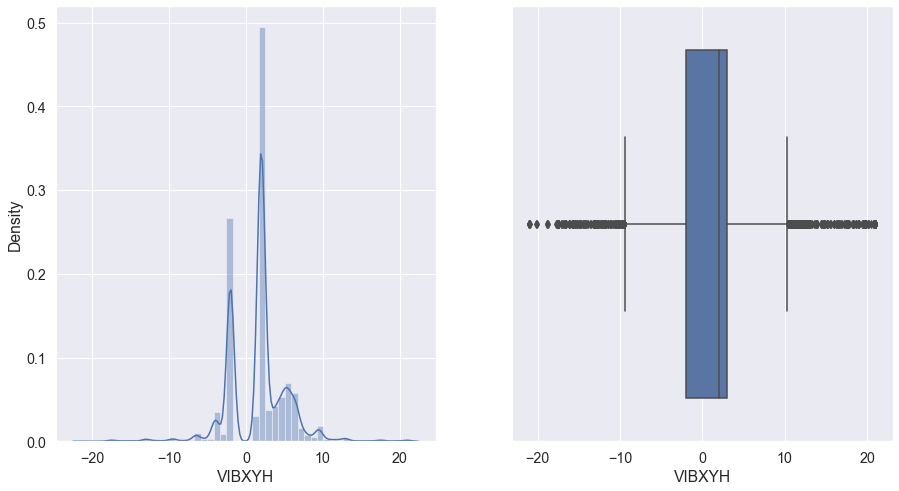

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1> VIBXYH Top Values </h1></div>

,index,DEPT,WOB,RPM,Flow in,Torque,SPP,ROP1 (m/hr),M.Wt in,M.Temp in,M.Temp out,VIBC,VIBXYH,VIBZH,SSS_H
0,21837,1721.4,32.28708,93.93209,692.4846,16696.000,1859.273,28.12308,9.2,46.53358,65.65012,510.00,21.0,6.50,24.22
1,20057,1358.6,38.31580,100.06570,827.1508,10424.290,2134.182,39.22349,9.1,40.44283,56.45243,20.00,21.0,2.00,14.91
2,20097,1370.6,30.28402,123.02300,827.1508,10047.140,2181.455,73.30316,9.1,40.55755,61.86703,71.79,21.0,2.00,10.00
3,20059,1359.0,36.42806,111.69040,828.6306,9310.000,2176.364,44.00685,9.1,40.43566,58.52973,20.00,21.0,3.86,25.32
4,20060,1359.2,36.42806,111.69040,828.6306,9310.000,2176.364,44.00685,9.1,40.43566,58.52973,20.00,21.0,5.13,30.53
5,20061,1359.4,36.42806,111.69040,828.6306,9310.000,2176.364,44.00685,9.1,40.43566,58.52973,20.00,21.0,6.41,35.74
6,20099,1371.0,28.49699,123.16900,824.0103,8791.429,2193.818,69.39541,9.1,40.57547,61.85340,40.00,21.0,4.64,10.00
7,20062,1359.6,36.42806,111.69040,828.6306,9310.000,2176.364,44.00685,9.1,40.43566,58.52973,21.11,21.0,7.69,64.03
8,20063,1359.8,36.42806,111.69040,828.6306,9310.000,2176.364,44.00685,9.1,40.43566,58.52973,24.82,21.0,8.97,93.55
9,20064,1360.0,32.18835,123.08140,831.7407,11105.710,2255.636,44.00685,9.1,40.43925,59.68076,28.54,21.0,10.25,123.06


<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1> VIBXYH Lowest Values </h1></div>

,index,DEPT,WOB,RPM,Flow in,Torque,SPP,ROP1 (m/hr),M.Wt in,M.Temp in,M.Temp out,VIBC,VIBXYH,VIBZH,SSS_H
0,11101,-1574.8,-26.07591,-114.7572,-840.1170,-13261.43,-2674.545,-15.21999,-9.0,-45.82642,-65.93333,-468.00,-21.00,-6.50,-8.22
1,11102,-1575.0,-27.08624,-115.3852,-843.2828,-13184.29,-2588.727,-12.37271,-9.0,-45.76415,-66.27448,-452.59,-21.00,-6.50,-10.32
2,11121,-1582.2,-30.21643,-141.9642,-830.8818,-16192.00,-2634.545,-16.53444,-9.0,-45.94717,-66.29057,-414.42,-21.00,-6.50,-23.21
3,11120,-1582.0,-30.21643,-141.9642,-830.8818,-16192.00,-2634.545,-16.53444,-9.0,-45.94717,-66.29057,-438.00,-21.00,-6.50,-40.00
4,11108,-1576.2,-22.84367,-114.3045,-840.1170,-13090.00,-2621.091,-10.92894,-9.0,-45.75472,-66.05724,-442.00,-20.90,-6.43,-12.28
5,11100,-1574.6,-26.07591,-114.7572,-840.1170,-13261.43,-2674.545,-15.21999,-9.0,-45.82642,-65.93333,-460.38,-20.26,-5.97,-10.00
6,11097,-1574.0,-26.07591,-114.7572,-840.1170,-13261.43,-2674.545,-15.21999,-9.0,-45.82642,-65.93333,-430.45,-20.12,-5.87,-9.84
7,11103,-1575.2,-27.08624,-115.3852,-843.2828,-13184.29,-2588.727,-12.37271,-9.0,-45.76415,-66.27448,-442.00,-18.90,-5.00,-12.00
8,11107,-1576.0,-22.84367,-114.3045,-840.1170,-13090.00,-2621.091,-10.92894,-9.0,-45.75472,-66.05724,-442.00,-18.84,-4.96,-15.03
9,11109,-1576.4,-22.84367,-114.3045,-840.1170,-13090.00,-2621.091,-10.92894,-9.0,-45.75472,-66.05724,-442.00,-18.78,-4.92,-12.62


<div style='text-align: center; color: black; background-color: yellow; border: 10px solid #404040; padding: 2px; border-radius: 10px;'><h1> VIBZH </h1></div>

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1> Descriptive Statistics </h1></div>

,VIBZH
count,28069.000000
mean,0.891392
std,2.469828
min,-20.370000
25%,-2.000000
50%,1.800000
75%,2.000000
max,21.000000


<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1> VIBZH Distribution Plot and Boxplot </h1></div>

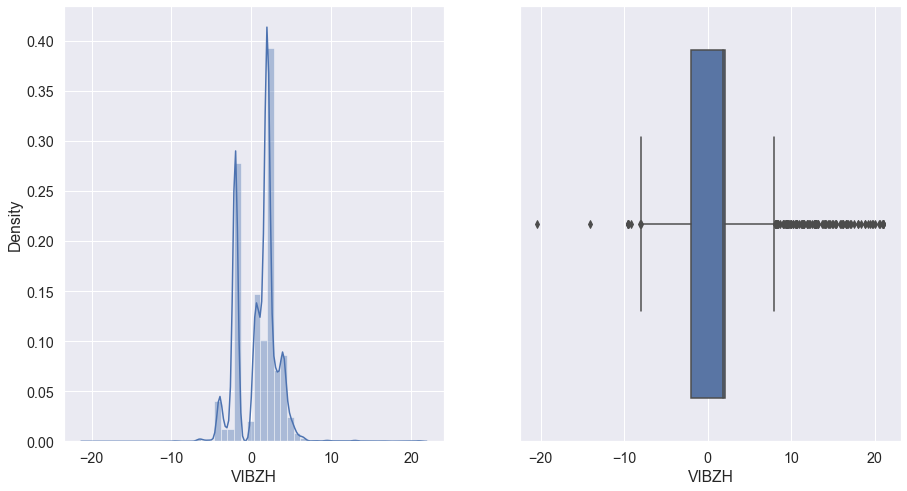

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1> VIBZH Top Values </h1></div>

,index,DEPT,WOB,RPM,Flow in,Torque,SPP,ROP1 (m/hr),M.Wt in,M.Temp in,M.Temp out,VIBC,VIBXYH,VIBZH,SSS_H
0,20075,1362.2,37.82077,123.0814,828.6306,13668.57,2276.364,48.38319,9.1,40.44641,60.69557,40.0,17.5,21.0,3.72
1,20085,1364.2,36.70379,123.1982,824.0103,10094.29,2224.364,48.79999,9.1,40.46434,61.17913,NaN,17.5,21.0,7.18
2,20086,1364.4,36.70379,123.1982,824.0103,10094.29,2224.364,48.79999,9.1,40.46434,61.17913,NaN,17.5,21.0,8.07
3,20084,1364.0,36.70379,123.1982,824.0103,10094.29,2224.364,48.79999,9.1,40.46434,61.17913,NaN,17.5,21.0,6.28
4,20083,1363.8,48.40539,123.1690,828.6306,13145.71,2261.818,46.45725,9.1,40.45359,60.99524,NaN,17.5,21.0,5.39
5,20073,1361.8,33.98197,121.1099,833.5634,15537.14,2164.000,43.80311,9.1,40.43925,60.31416,40.0,17.5,21.0,5.48
6,20074,1362.0,37.82077,123.0814,828.6306,13668.57,2276.364,48.38319,9.1,40.44641,60.69557,40.0,17.5,21.0,4.60
7,20087,1364.6,36.70379,123.1982,824.0103,10094.29,2224.364,48.79999,9.1,40.46434,61.17913,NaN,17.5,21.0,8.97
8,20077,1362.6,37.82077,123.0814,828.6306,13668.57,2276.364,48.38319,9.1,40.44641,60.69557,40.0,17.5,21.0,1.97
9,20076,1362.4,37.82077,123.0814,828.6306,13668.57,2276.364,48.38319,9.1,40.44641,60.69557,40.0,17.5,21.0,2.84


<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1> VIBZH Lowest Values </h1></div>

,index,DEPT,WOB,RPM,Flow in,Torque,SPP,ROP1 (m/hr),M.Wt in,M.Temp in,M.Temp out,VIBC,VIBXYH,VIBZH,SSS_H
0,16107,-2897.4,-36.451770,-131.31800,-613.5753,-9027.143,-2150.5450,-11.52614,-9.5,-45.63774,-69.75839,-29.93,-6.35,-20.37,-208.41
1,16106,-2897.2,-36.451770,-131.31800,-613.5753,-9027.143,-2150.5450,-11.52614,-9.5,-45.63774,-69.75839,-35.52,-4.85,-14.03,-192.40
2,9034,-1138.4,-6.605083,-80.86163,-452.7565,-1674.609,-950.0353,-22.87482,-9.0,-35.81321,-46.95816,-131.75,-14.45,-9.50,-103.89
3,9039,-1139.4,-29.253290,-80.92004,-452.7565,-6545.714,-932.2941,-47.14108,-9.0,-35.82076,-46.72659,-130.69,-17.12,-9.50,-83.00
4,9033,-1138.2,-6.605083,-80.86163,-452.7565,-1674.609,-950.0353,-22.87482,-9.0,-35.81321,-46.95816,-198.79,-13.91,-9.50,-111.00
5,9037,-1139.0,-29.253290,-80.92004,-452.7565,-6545.714,-932.2941,-47.14108,-9.0,-35.82076,-46.72659,-30.97,-16.05,-9.50,-83.00
6,9036,-1138.8,-6.605083,-80.86163,-452.7565,-1674.609,-950.0353,-22.87482,-9.0,-35.81321,-46.95816,-45.20,-15.52,-9.50,-86.11
7,9035,-1138.6,-6.605083,-80.86163,-452.7565,-1674.609,-950.0353,-22.87482,-9.0,-35.81321,-46.95816,-64.70,-14.98,-9.50,-95.00
8,9038,-1139.2,-29.253290,-80.92004,-452.7565,-6545.714,-932.2941,-47.14108,-9.0,-35.82076,-46.72659,-67.25,-16.59,-9.50,-83.00
9,9040,-1139.6,-29.253290,-80.92004,-452.7565,-6545.714,-932.2941,-47.14108,-9.0,-35.82076,-46.72659,-194.13,-16.18,-9.14,-84.29


In [62]:
Label_Columns=['VIBC', 'VIBXYH', 'VIBZH']
for col in Label_Columns:
    analyze_column(well_Data, col)

<div style="color:yellow;display:fill;border-radius:8px;
            background-color:#0000FF;font-size:150%;
            font-family:Nexa;letter-spacing:0.5px">
    <p style="padding: 8px
;color:white;"><b>5.2 | Numerical Features </b></p>
</div>

In [39]:
well_Data=pd.read_csv('clean.csv')

well_Data=well_Data[['DEPT','WOB', 'RPM','Flow in','Torque','SPP', '  ROP1   (m/hr)','M.Wt in','M.Temp in', 'M.Temp out','VIBC','VIBXYH', 'VIBZH','SSS_H' ]]

In [41]:
def Num_feature_analysis(df, col, target_columns=['SSL_H', 'VIBC', 'VIBXYH', 'VIBZH']):
    # Display summary statistics
    header = f"<div style='text-align: center; color: blue;'><h3>Summary statistics for {col}:</h3></div>"
    display(Markdown(header))
    
    # Create subplots
    fig, axes = plt.subplots(len(target_columns), 2, figsize=(15, len(target_columns) * 8))

    for i, target_col in enumerate(target_columns):
        # Distribution plot
        sns.distplot(df[col], bins=30, kde=True, ax=axes[i, 0], color='skyblue', 
                     kde_kws={'color': 'black'}, hist_kws={'edgecolor': 'black'})
        axes[i, 0].set_title(f'Distribution of {col} for {target_col}')

        # Boxplot with stripplot
        sns.boxplot(data=df, x=col, ax=axes[i, 1], color='salmon')
        sns.stripplot(data=df, x=col, color='green', ax=axes[i, 1], alpha=0.5)
        axes[i, 1].set_title(f'Boxplot and Stripplot of {col} for {target_col}')

    # Add space between plots
    plt.subplots_adjust(hspace=0.5, top=0.9)

    # Additional styling
    plt.tight_layout()
    plt.show()


<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>DEPT</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for DEPT:</h3></div>

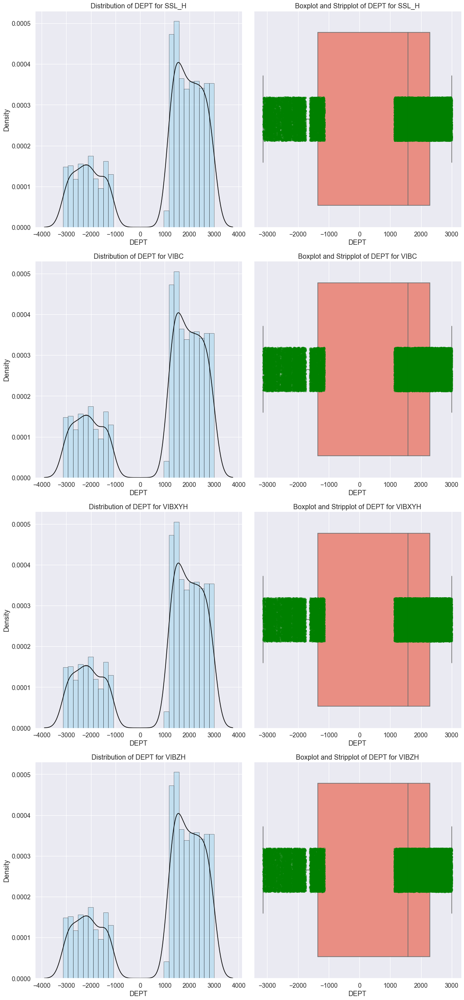

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>WOB</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for WOB:</h3></div>

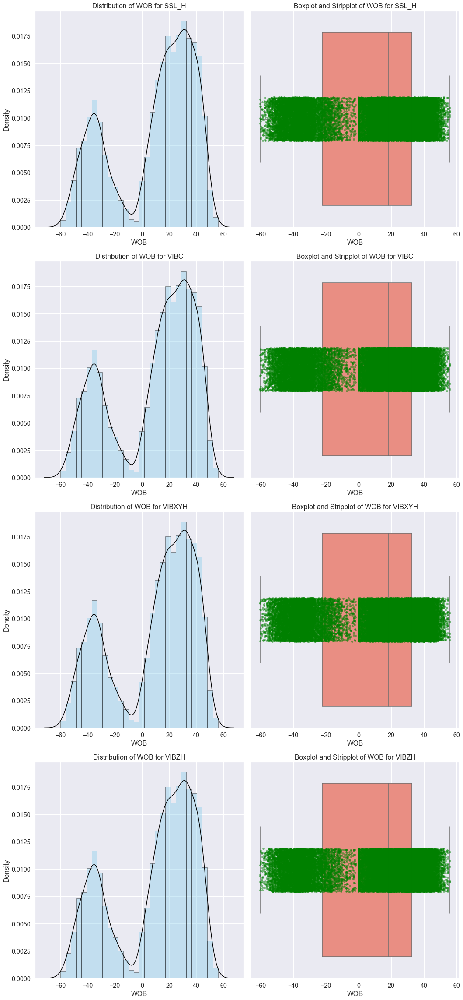

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>RPM</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for RPM:</h3></div>

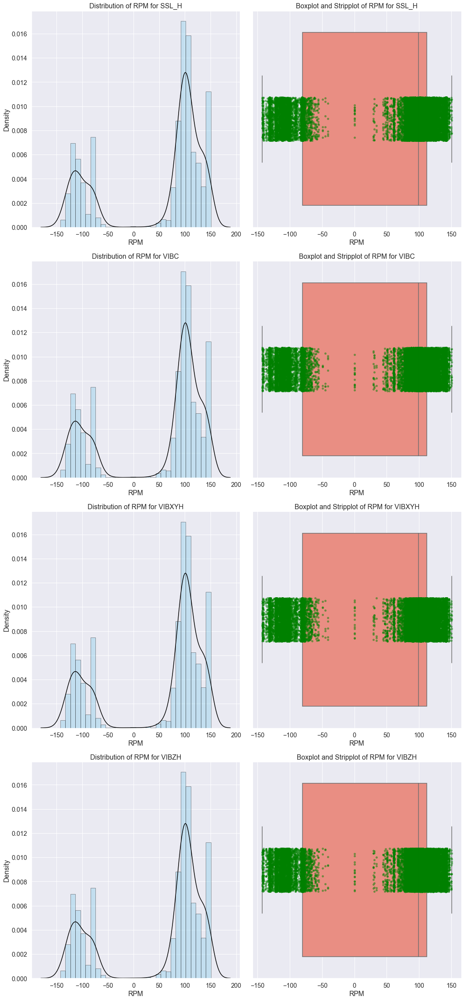

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>Flow in</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for Flow in:</h3></div>

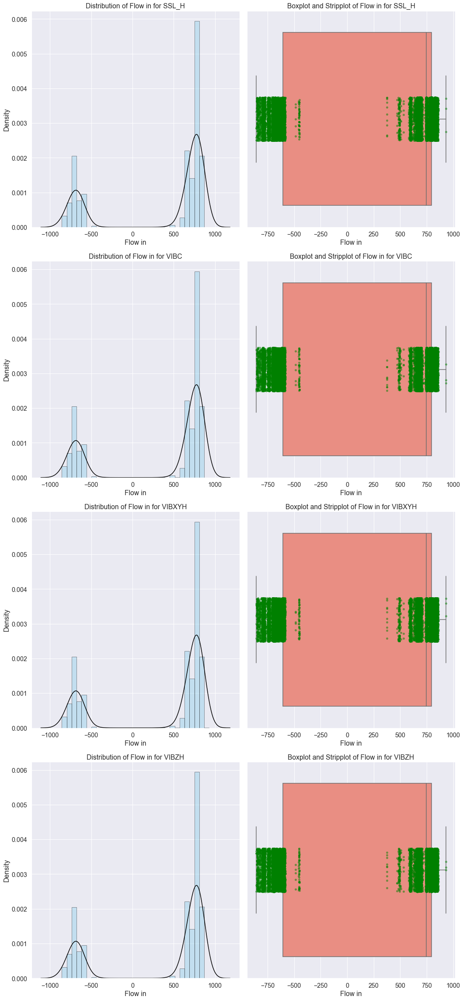

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>Torque</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for Torque:</h3></div>

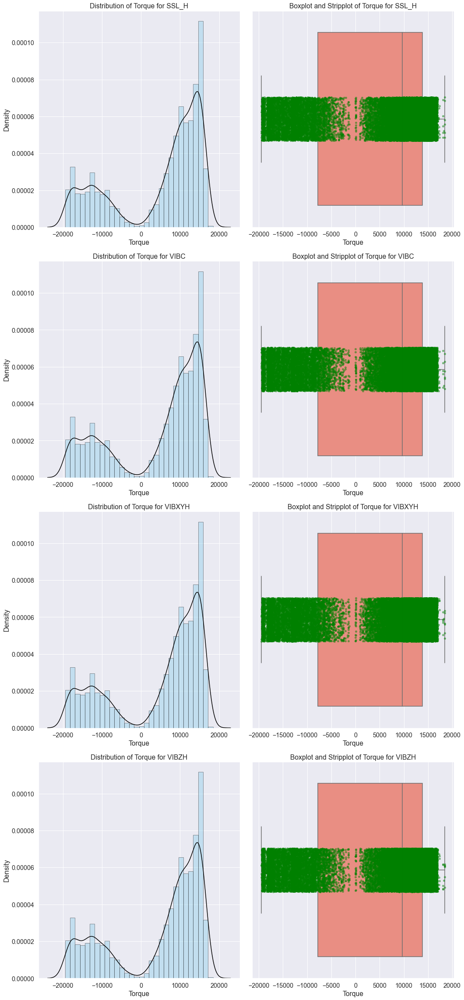

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>SPP</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for SPP:</h3></div>

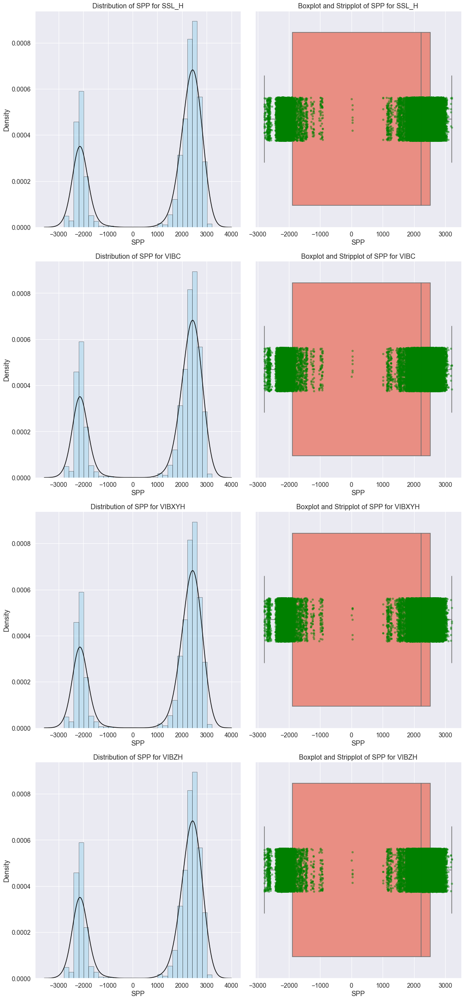

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>  ROP1   (m/hr)</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for   ROP1   (m/hr):</h3></div>

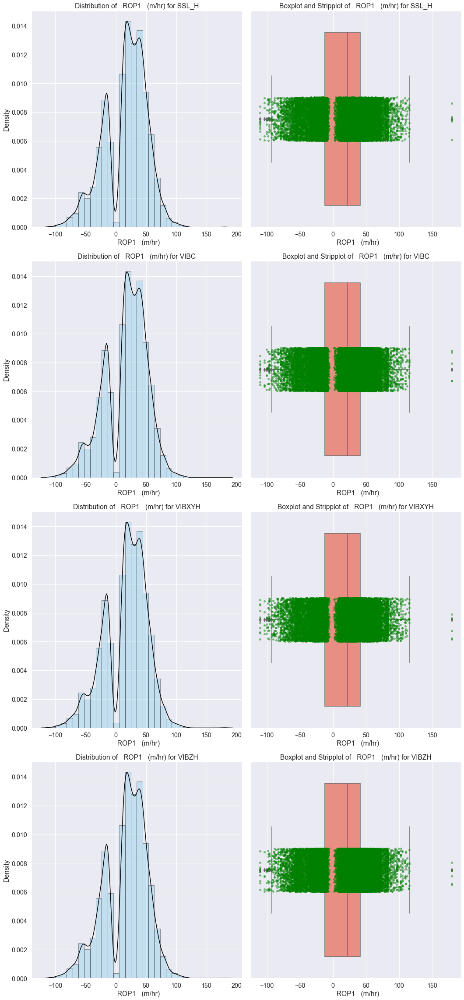

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>M.Wt in</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for M.Wt in:</h3></div>

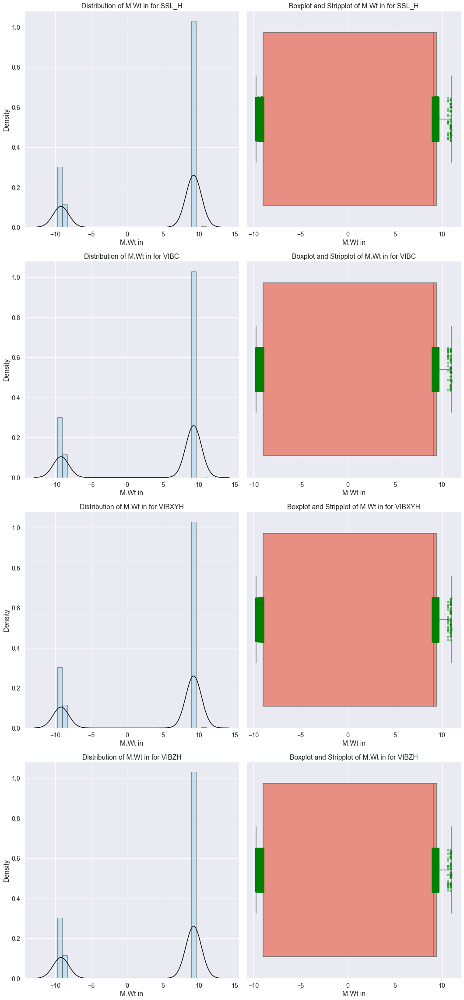

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>M.Temp in</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for M.Temp in:</h3></div>

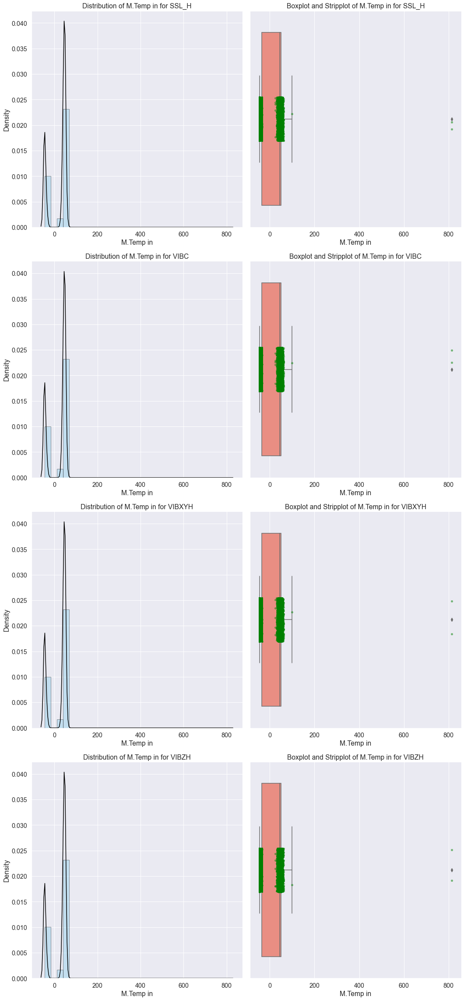

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>M.Temp out</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for M.Temp out:</h3></div>

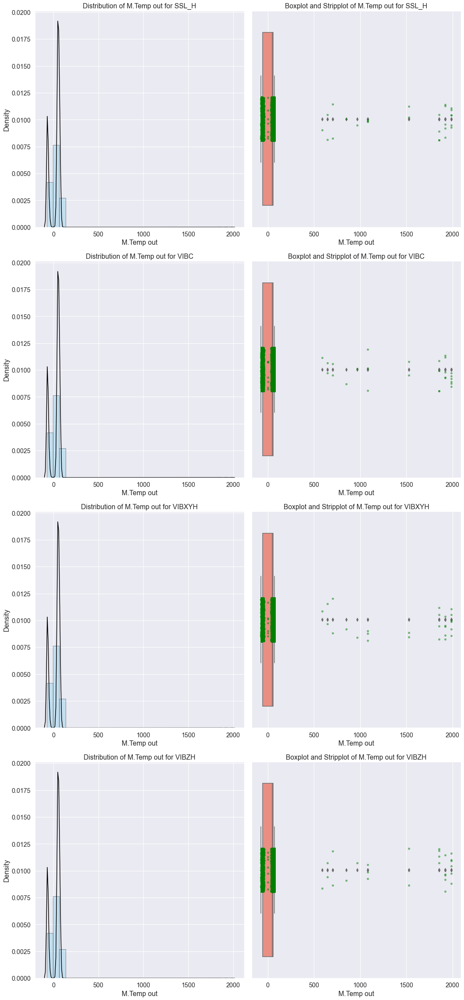

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>VIBC</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for VIBC:</h3></div>

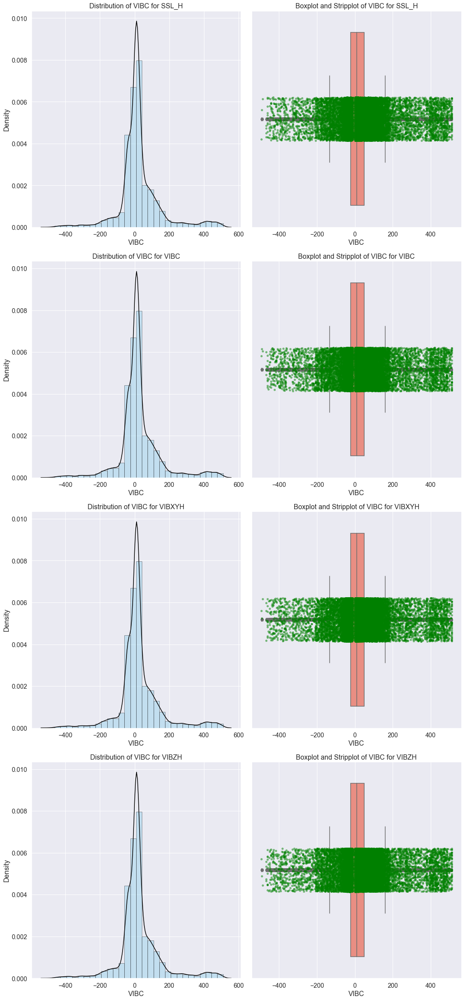

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>VIBXYH</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for VIBXYH:</h3></div>

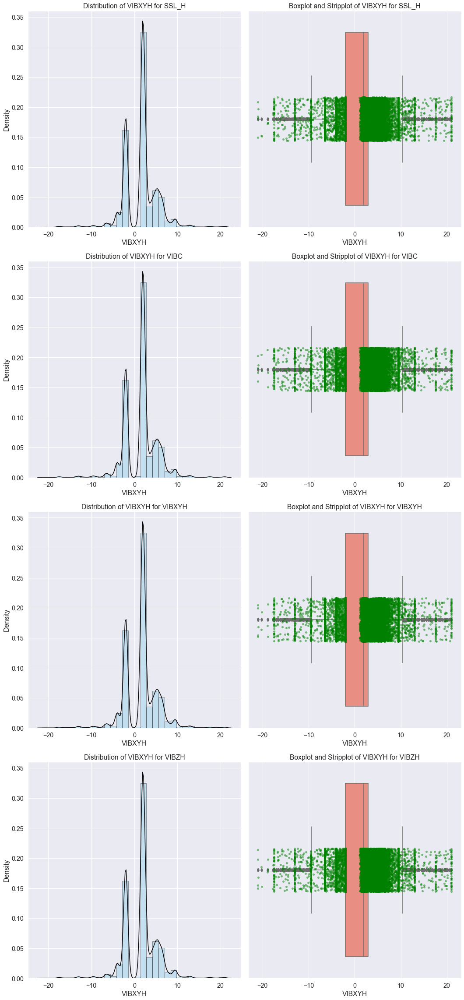

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>VIBZH</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for VIBZH:</h3></div>

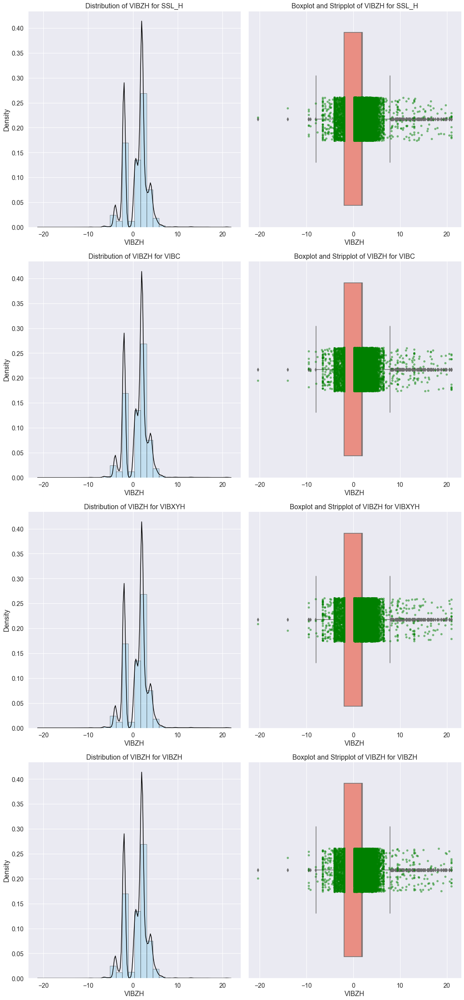

<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>SSS_H</h1><p>No description available.</p></div>

<div style='text-align: center; color: blue;'><h3>Summary statistics for SSS_H:</h3></div>

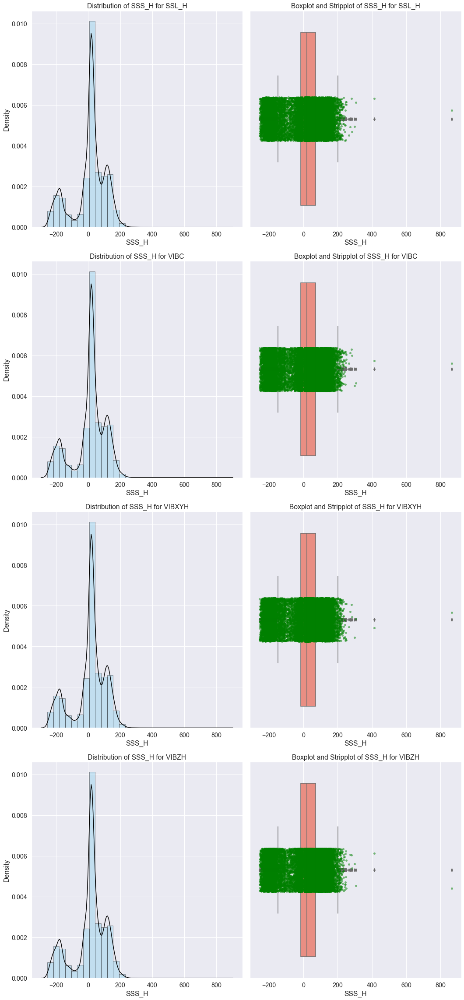

In [43]:
from IPython.display import Markdown, display

# External dictionary with column descriptions
column_descriptions = {
    'MD(mt)': 'Description for Column1.',
    'Column2': 'Description for Column2.',
    # Add descriptions for other columns
}

for col in well_Data.columns:
    # Fetch the description from the external dictionary
    column_description = column_descriptions.get(col, 'No description available.')

    # Create the header with description
    header = f"<div style='text-align: center; color: white; background-color: #505050; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>{col}</h1><p>{column_description}</p></div>"
    
    # Display the header
    display(Markdown(header))
    
    # Run your analysis function
    Num_feature_analysis(well_Data, col)


  <div style="color:yellow;display:fill;border-radius:8px;
            background-color:#ffcc00;font-size:150%;
            font-family:Nexa;letter-spacing:0.5px">
    <p style="padding: 8px
;color:black;"><b> Correlation Matrix   </b></p>
</div>

In [44]:
import seaborn as sns

def corrMat(df, title='Correlation Matrix', figsize=(12, 8), save_path=None):
    
    corr_mat = df.corr().round(2)

    f, ax = plt.subplots(figsize=figsize)
    mask = np.zeros_like(corr_mat, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True

    sns.heatmap(corr_mat, mask=mask, vmin=-1, vmax=1, center=0,
                cmap='viridis', square=True, linewidths=.5,
                annot=True, cbar=True, fmt='.2f')

    plt.title(title, fontsize=16)
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')

    plt.show()

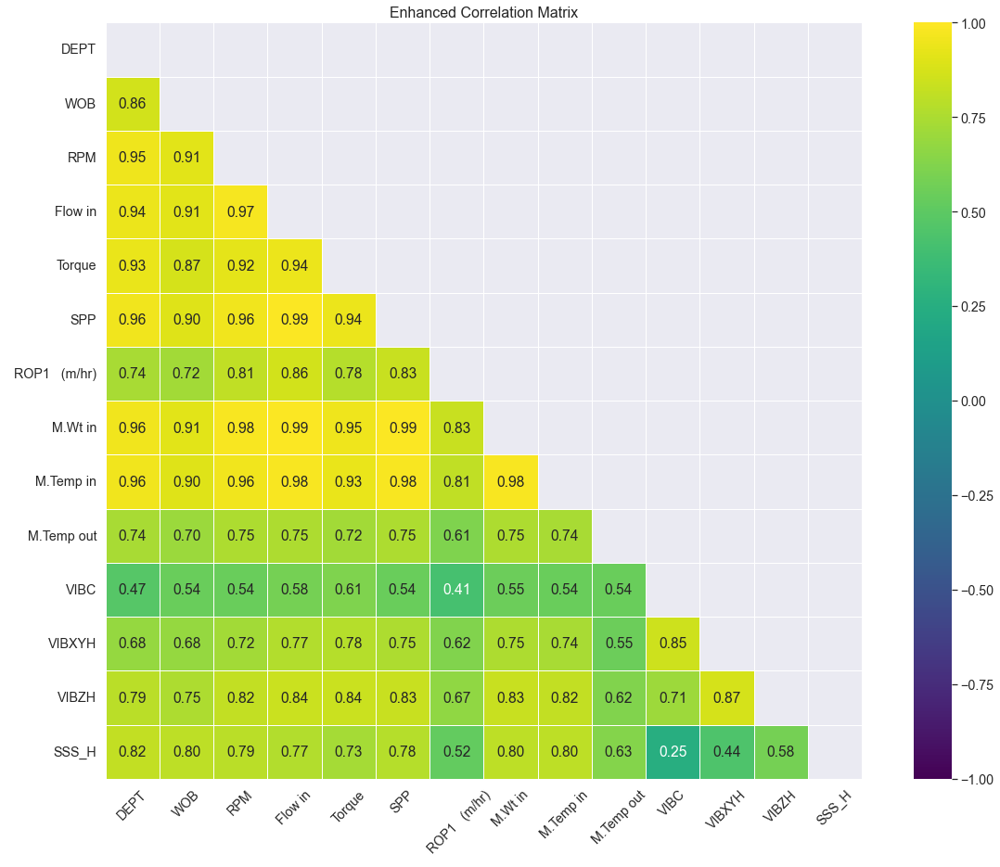

In [45]:
corrMat(well_Data, title='Enhanced Correlation Matrix', figsize=(20, 15), save_path='correlation_matrix.png')

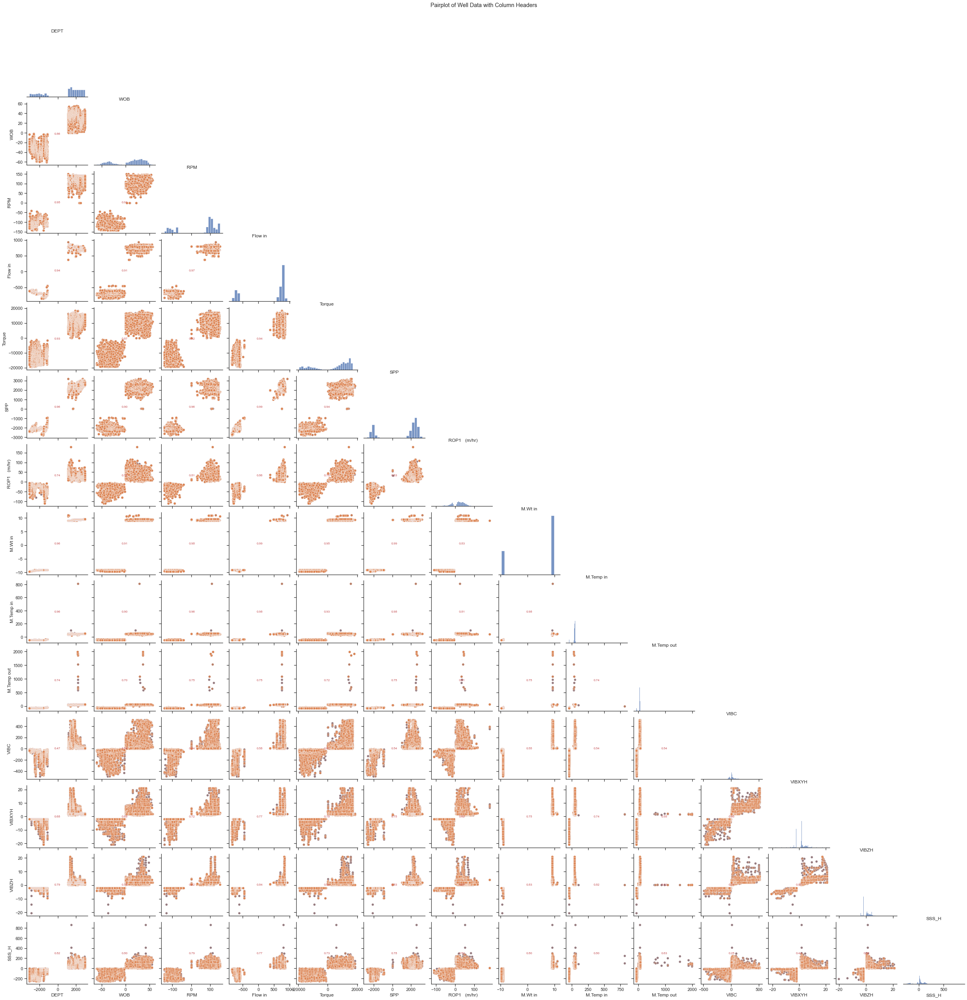

In [46]:
# Set style and color codes
sns.set(style="ticks", color_codes=True)

# Create pairplot showing only the lower triangle
pair_plot = sns.pairplot(well_Data, corner=True)

# Set title
pair_plot.fig.suptitle("Pairplot of Well Data with Column Headers", y=1.02)

# Show column headers on the diagonal axes
for i, text in enumerate(pair_plot.diag_axes):
    text.set_title(well_Data.columns[i])

# Customize plot appearance
pair_plot.map_lower(sns.scatterplot, alpha=0.5)  # Customize lower triangle with scatter plots

# Add correlation coefficients
corr_values = well_Data.corr().values
for i, (ax_row, ax_col) in enumerate(zip(pair_plot.axes, pair_plot.axes.T)):
    for j, ax in enumerate(ax_col):
        if i < j:
            ax.annotate(f"{corr_values[i, j]:.2f}", xy=(0.5, 0.5), xycoords="axes fraction",
                        ha="center", va="center", fontsize=8, color="r")

# Adjust plot layout
pair_plot.fig.subplots_adjust(wspace=0.1, hspace=0.1)

# Display the plot
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()


# <b>7<span style='color:#0000FF'>|</span> Split Dataset for Training and Testing </b>

In [47]:
target_columns = ['SSS_H','VIBC','VIBXYH', 'VIBZH']
features = well_Data.drop(target_columns, axis=1)
targets = well_Data[target_columns]

# fill missing values using mean
features = features.fillna(features.mean())
targets = targets.fillna(targets.mean())

# Splitting into train and test sets (80% train, 20% test)
x_train, x_test, y_train, y_test = train_test_split(features, targets, shuffle=True, test_size=0.2, random_state=44)

# Further split the training data into train and validation sets (80% train, 10% validation)
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, shuffle=True, test_size=0.125, random_state=44)

print('Shape of training feature:', x_train.shape)
print('Shape of validation feature:', x_val.shape)
print('Shape of testing feature:', x_test.shape)
print('Shape of training label:', y_train.shape)
print('Shape of validation label:', y_val.shape)
print('Shape of testing label:', y_test.shape)


Shape of training feature: (19648, 10)
Shape of validation feature: (2807, 10)
Shape of testing feature: (5614, 10)
Shape of training label: (19648, 4)
Shape of validation label: (2807, 4)
Shape of testing label: (5614, 4)


# <b>8<span style='color:#0000FF'>|</span> Standrization </b>

In [48]:
# Scaling the features
scaler = StandardScaler()
scaler.fit(x_train)

x_train_scaled = scaler.transform(x_train)
x_val_scaled = scaler.transform(x_val)
x_test_scaled = scaler.transform(x_test)

# <b>9 <span style='color:#0000FF'>|</span> Modeling </b>

<div style='text-align: center; color: black; background-color: yellow; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>Linear Regression</h1><p>Replace with your model description</p></div>

Training MSE Score: 47.448229956708566
Training R-squared: 0.6923592322581018
Validation MSE Score: 48.33205452127049
Validation R-squared: 0.6852871664276388
Testing MSE Score: 48.45417841759862
Testing R-squared: 0.6885389060429081
------------------------------


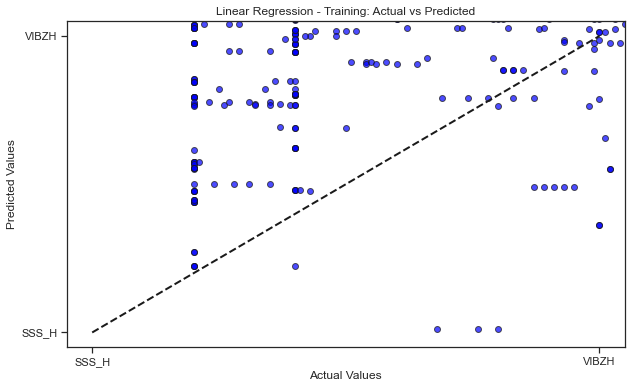

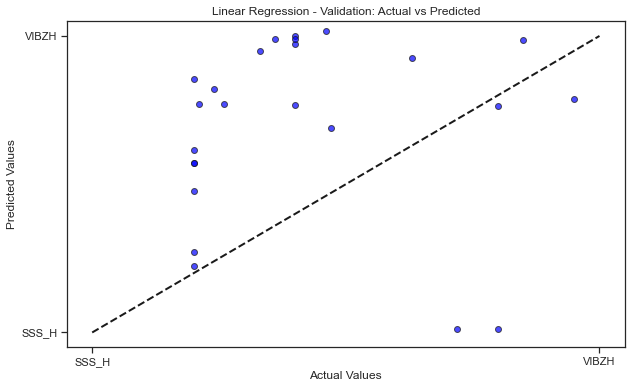

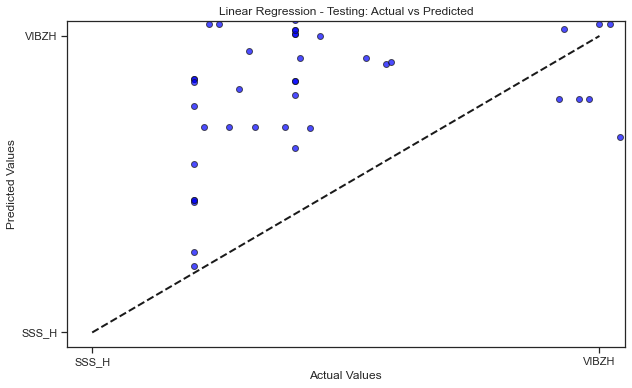

<div style='text-align: center; color: black; background-color: yellow; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>KNN Regressor</h1><p>Replace with your model description</p></div>

Training MSE Score: 14.511162747745798
Training R-squared: 0.9664753067028646
Validation MSE Score: 20.29824306046389
Validation R-squared: 0.9255659358389219
Testing MSE Score: 20.591939286466403
Testing R-squared: 0.929671497990703
------------------------------


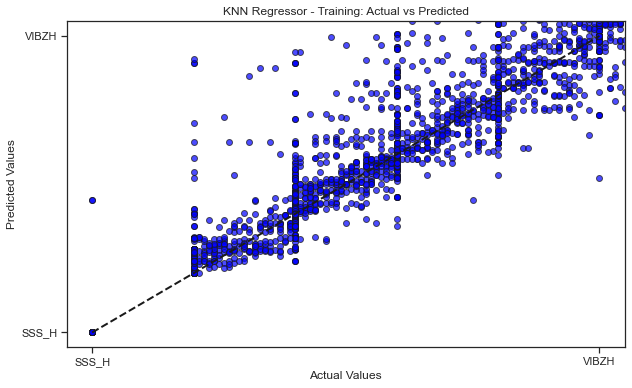

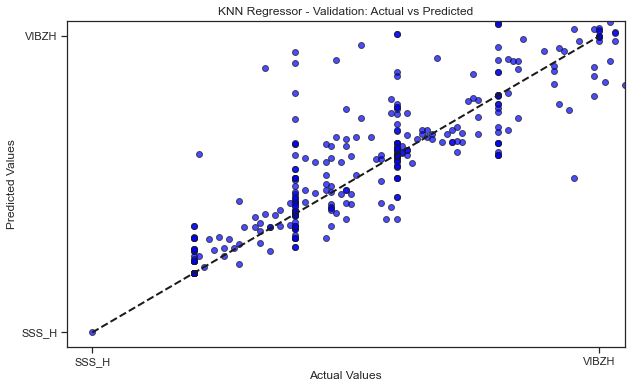

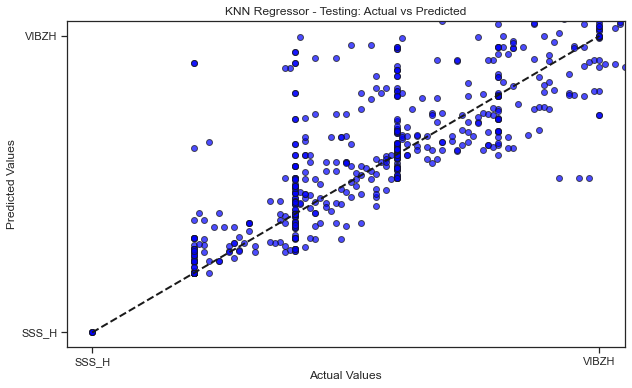

<div style='text-align: center; color: black; background-color: yellow; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>Decision Tree</h1><p>Replace with your model description</p></div>

Training MSE Score: 0.0019926128334196574
Training R-squared: 0.9999999996155307
Validation MSE Score: 11.322184663196095
Validation R-squared: 0.9812814391522313
Testing MSE Score: 11.978199265325582
Testing R-squared: 0.9772073231594413
------------------------------


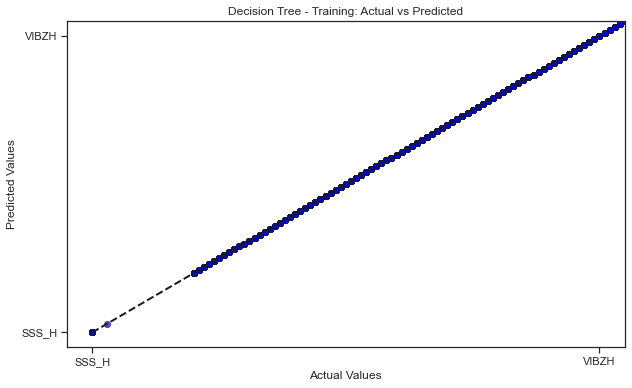

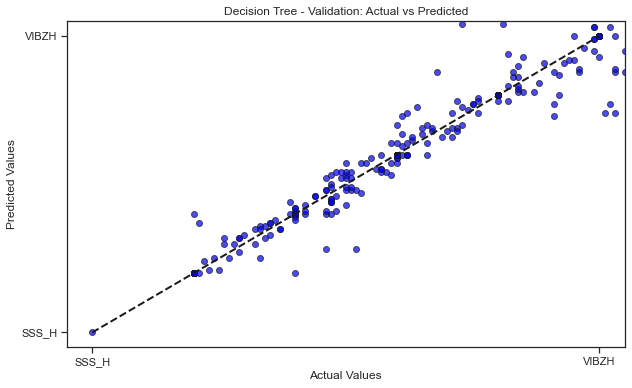

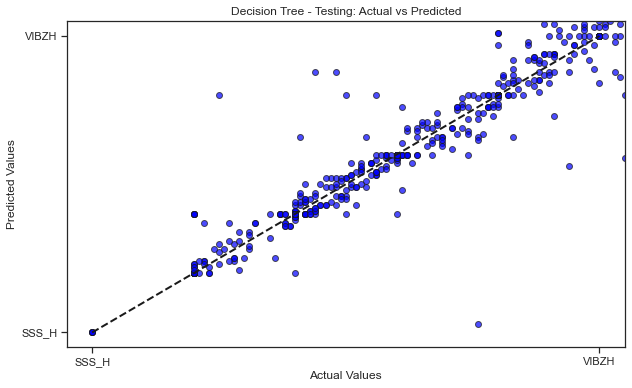

<div style='text-align: center; color: black; background-color: yellow; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>XGBoost</h1><p>Replace with your model description</p></div>

Training MSE Score: 9.767640110233499
Training R-squared: 0.9871667264083237
Validation MSE Score: 12.913059141469184
Validation R-squared: 0.9752418296297358
Testing MSE Score: 13.409832452971935
Testing R-squared: 0.9725252692637327
------------------------------


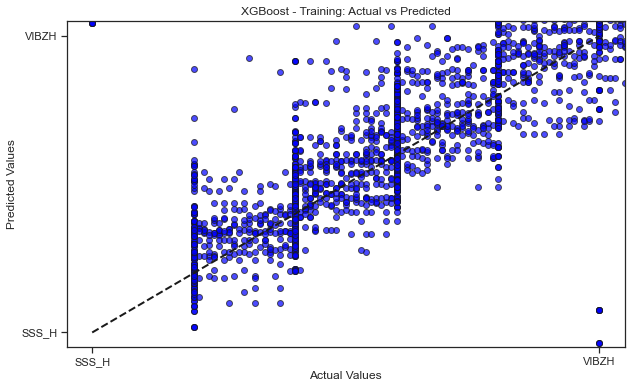

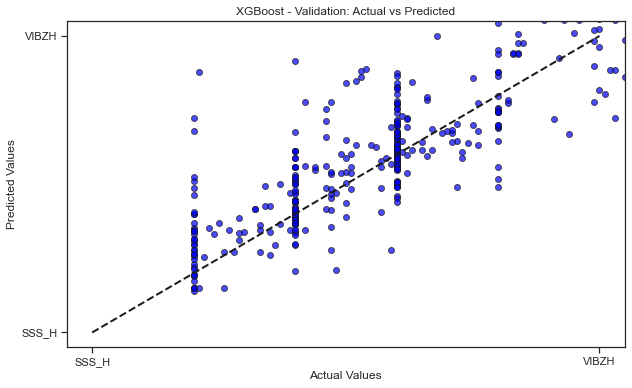

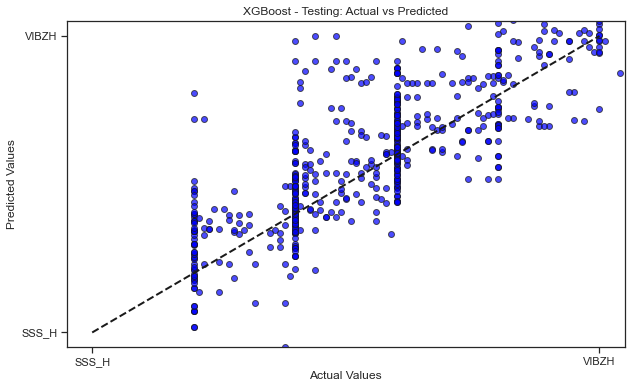

<div style='text-align: center; color: black; background-color: yellow; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>Random Forest</h1><p>Replace with your model description</p></div>

Training MSE Score: 4.26145293786181
Training R-squared: 0.9970908362310039
Validation MSE Score: 10.518097117283952
Validation R-squared: 0.9811562936521763
Testing MSE Score: 11.333259113232378
Testing R-squared: 0.979433643787735
------------------------------


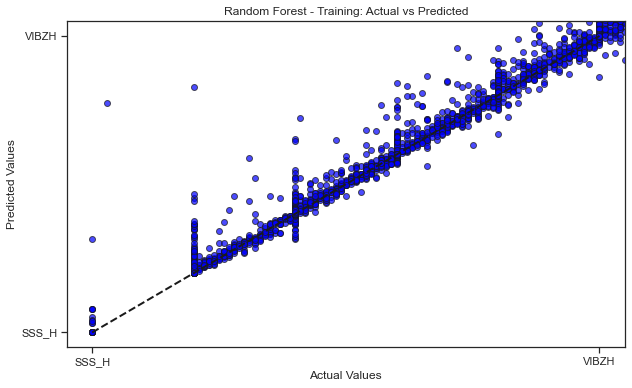

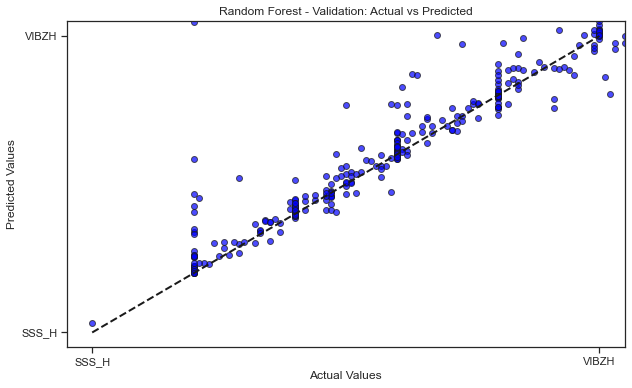

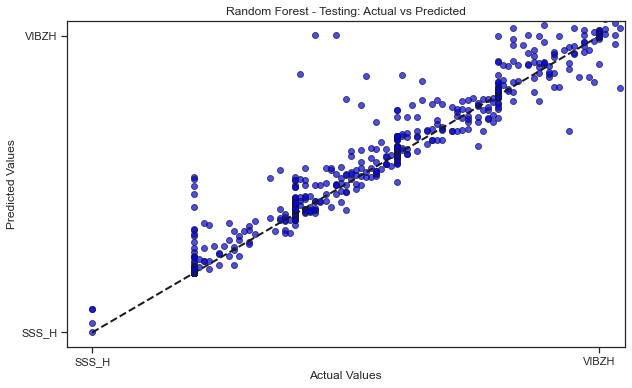


Best Model based on Validation R-squared Score: Decision Tree with R-squared Score of 0.9813


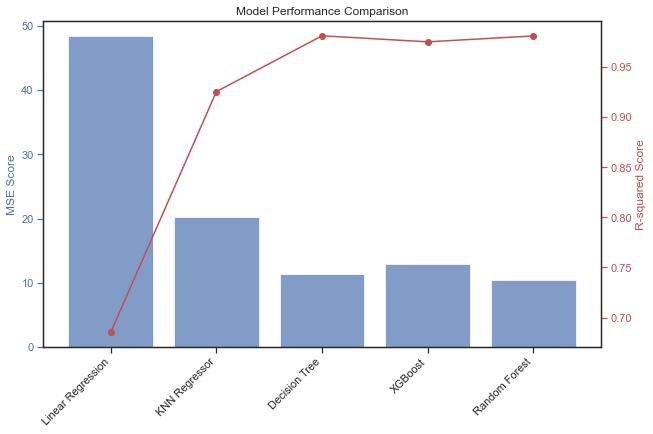

In [49]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.preprocessing import StandardScaler
from IPython.display import display, Markdown

# Function to visualize actual vs predicted values
def visualize_predictions(model_name, y_true, y_pred, dataset_name):
    plt.scatter(y_true, y_pred, c='blue', edgecolors='k', alpha=0.7)
    plt.plot([min(y_true), max(y_true)], [min(y_true), max(y_true)], 'k--', lw=2)  # Ideal line
    plt.title(f'{model_name} - {dataset_name}: Actual vs Predicted')
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')
    plt.show()

# Splitting the data into train, validation, and test sets
# Assuming you have already split your data into x_train, x_val, x_test, y_train, y_val, and y_test
# Scale the features
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_val_scaled = scaler.transform(x_val)
x_test_scaled = scaler.transform(x_test)

# Model definitions
models = {
    "Linear Regression": LinearRegression(),
    "KNN Regressor": KNeighborsRegressor(), 
    "Decision Tree": DecisionTreeRegressor(),
    "XGBoost": XGBRegressor(),
    "Random Forest": RandomForestRegressor()
}

# Lists to store results for visualization
mse_scores = []
r2_scores = []

best_model_name = None
best_r2_score = -np.inf  # Initialize with negative infinity

for name, model in models.items():

    # Fetch the description from the external dictionary (replace with your descriptions)
    column_description = "Replace with your model description"
    
    # Create the header with description
    header = f"<div style='text-align: center; color: black; background-color: yellow; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>{name}</h1><p>{column_description}</p></div>"
    
    # Display the header
    display(Markdown(header))
    
    # Fit the model
    model.fit(x_train_scaled, y_train)
    
    # Predictions on the training, validation, and testing data
    y_pred_train = model.predict(x_train_scaled)
    y_pred_val = model.predict(x_val_scaled)
    y_pred_test = model.predict(x_test_scaled)
    
    # Compute MSE and R-squared scores
    mse_train = np.sqrt(mean_squared_error(y_train, y_pred_train))
    r2_train = r2_score(y_train, y_pred_train)
    
    mse_val = np.sqrt(mean_squared_error(y_val, y_pred_val))
    r2_val = r2_score(y_val, y_pred_val)
    
    mse_test = np.sqrt(mean_squared_error(y_test, y_pred_test))
    r2_test = r2_score(y_test, y_pred_test)
    
    mse_scores.append((name, mse_val))  # Use the validation MSE for comparison
    r2_scores.append((name, r2_val))
    
    print(f'Training MSE Score: {mse_train}')
    print(f'Training R-squared: {r2_train}')
    print(f'Validation MSE Score: {mse_val}')
    print(f'Validation R-squared: {r2_val}')
    print(f'Testing MSE Score: {mse_test}')
    print(f'Testing R-squared: {r2_test}')
    print('-' * 30)
    
    # Check if the current model has a higher R-squared score than the current best
    if r2_val > best_r2_score:
        best_r2_score = r2_val
        best_model_name = name
    
    # Visualize predictions for training, validation, and testing data
    visualize_predictions(name, y_train, y_pred_train, 'Training')
    visualize_predictions(name, y_val, y_pred_val, 'Validation')
    visualize_predictions(name, y_test, y_pred_test, 'Testing')

# Visualize MSE scores
fig, ax1 = plt.subplots(figsize=(10, 6))

ax1.bar([model[0] for model in mse_scores], [model[1] for model in mse_scores], color='b', alpha=0.7)
ax1.set_ylabel('MSE Score', color='b')
ax1.set_xticklabels([model[0] for model in mse_scores], rotation=45, ha='right')
ax1.tick_params('y', colors='b')

# Create a second y-axis for R-squared scores
ax2 = ax1.twinx()
ax2.plot([model[0] for model in r2_scores], [model[1] for model in r2_scores], color='r', marker='o')
ax2.set_ylabel('R-squared Score', color='r')
ax2.tick_params('y', colors='r')

plt.title('Model Performance Comparison')

# Print the best model
print(f'\nBest Model based on Validation R-squared Score: {best_model_name} with R-squared Score of {best_r2_score:.4f}')

plt.show()


<p style= "font-family:Georgia;color:#000000;font-size:110%;text-align:center;border-radius:10px 10px;border-style: solid;border-width:5px;border-color:#fbff00;"><br>The best models' results is <b>RandomForestRegressor<b></b>
    <br></p>
    

<div style='text-align: center; color: black; background-color: yellow; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>Linear Regression</h1><p>Replace with your model description</p></div>

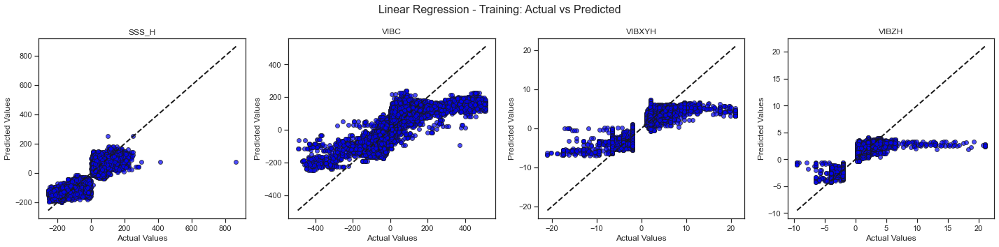

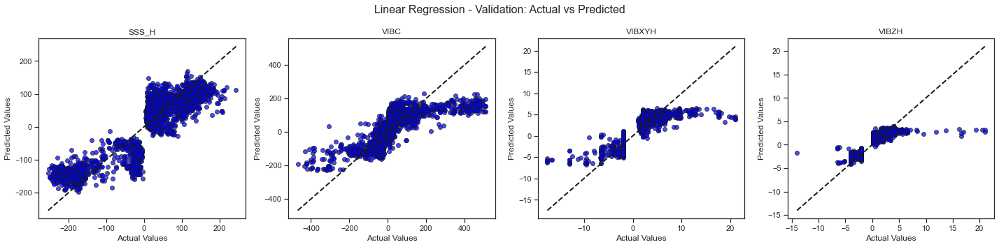

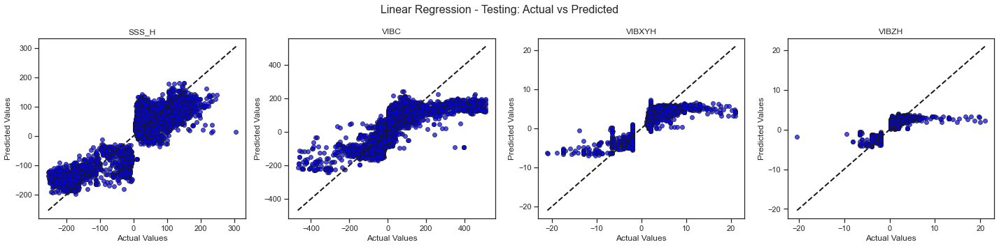

<div style='text-align: center; color: black; background-color: yellow; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>KNN Regressor</h1><p>Replace with your model description</p></div>

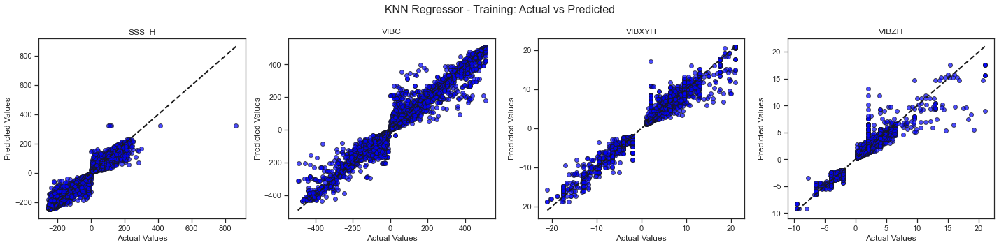

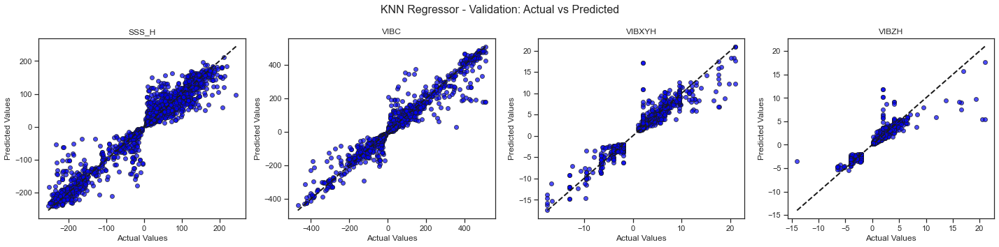

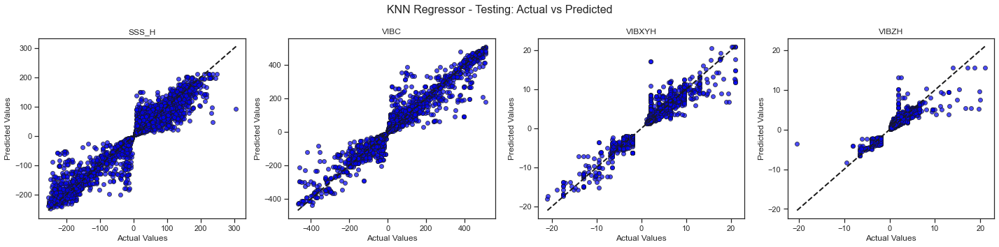

<div style='text-align: center; color: black; background-color: yellow; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>Decision Tree</h1><p>Replace with your model description</p></div>

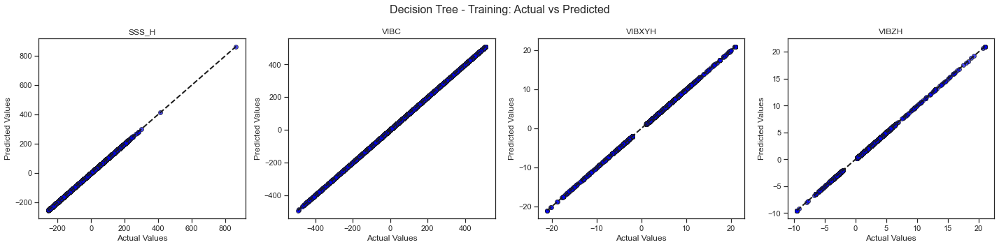

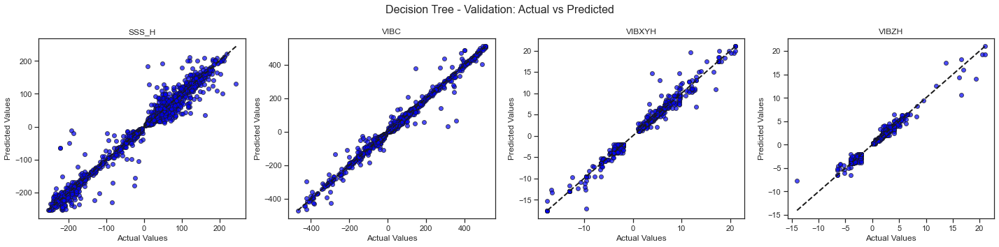

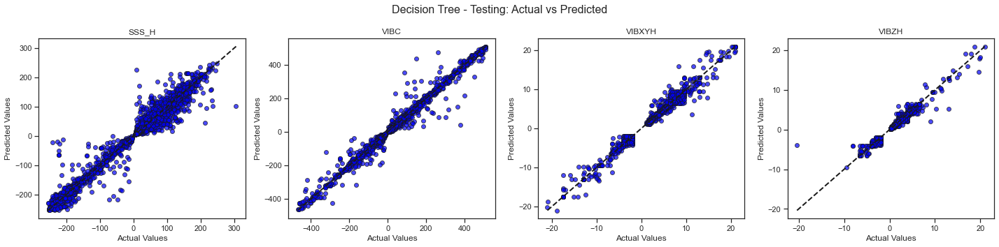

<div style='text-align: center; color: black; background-color: yellow; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>XGBoost</h1><p>Replace with your model description</p></div>

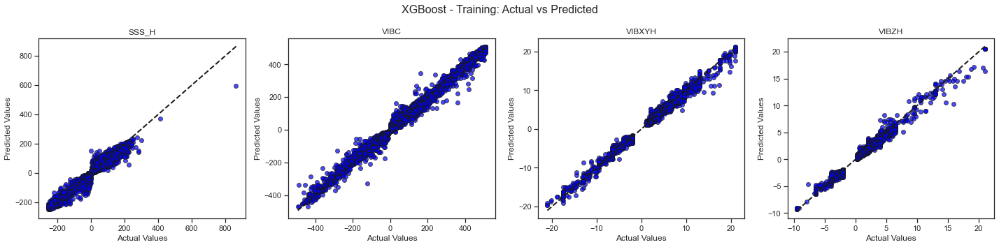

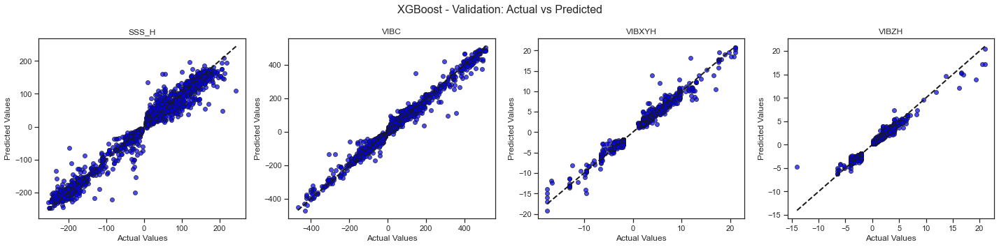

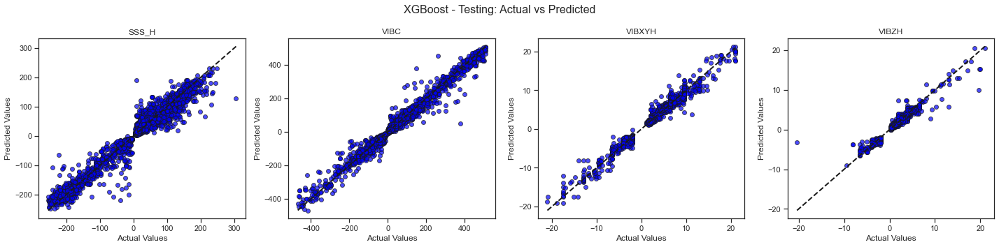

<div style='text-align: center; color: black; background-color: yellow; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>Random Forest</h1><p>Replace with your model description</p></div>

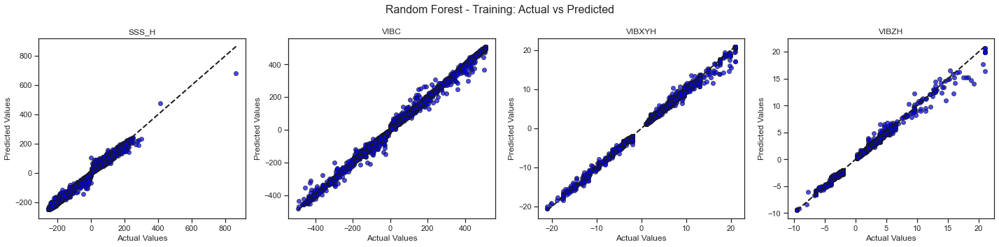

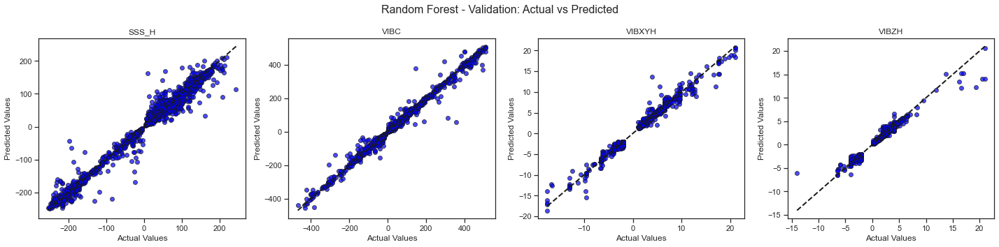

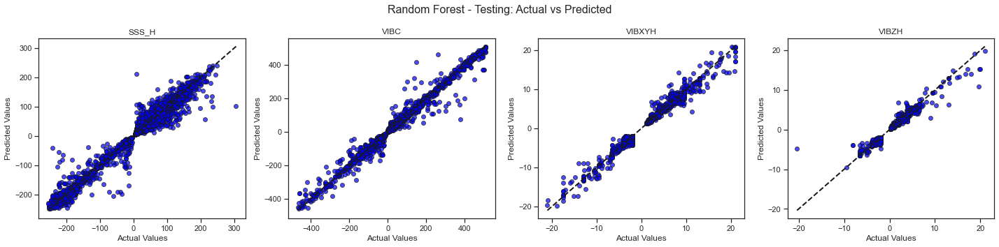

In [50]:
# Function to visualize actual vs predicted values for multiple target columns
def visualize_predictions(model_name, y_true, y_pred, dataset_name, target_columns):
    num_cols = len(target_columns)
    fig, axs = plt.subplots(1, num_cols, figsize=(5*num_cols, 5))
    fig.suptitle(f'{model_name} - {dataset_name}: Actual vs Predicted', fontsize=16)

    for i, target_col in enumerate(target_columns):
        axs[i].scatter(y_true[:, i], y_pred[:, i], c='blue', edgecolors='k', alpha=0.7)
        axs[i].plot([min(y_true[:, i]), max(y_true[:, i])], [min(y_true[:, i]), max(y_true[:, i])], 'k--', lw=2)  # Ideal line
        axs[i].set_title(f'{target_col}')
        axs[i].set_xlabel('Actual Values')
        axs[i].set_ylabel('Predicted Values')

    plt.tight_layout()
    plt.show()

# Assuming you have y_train, y_val, y_test for each target column
y_train_all = np.array([y_train[col].values for col in target_columns]).T
y_val_all = np.array([y_val[col].values for col in target_columns]).T
y_test_all = np.array([y_test[col].values for col in target_columns]).T

for name, model in models.items():
    # Fetch the description from the external dictionary (replace with your descriptions)
    column_description = "Replace with your model description"
    
    # Create the header with description
    header = f"<div style='text-align: center; color: black; background-color: yellow; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>{name}</h1><p>{column_description}</p></div>"
    
    # Display the header
    display(Markdown(header))
    
    # Fit the model
    model.fit(x_train_scaled, y_train_all)
    
    # Predictions on the training, validation, and testing data
    y_pred_train = model.predict(x_train_scaled)
    y_pred_val = model.predict(x_val_scaled)
    y_pred_test = model.predict(x_test_scaled)
    
    # Visualize predictions for training, validation, and testing data
    visualize_predictions(name, y_train_all, y_pred_train, 'Training', target_columns)
    visualize_predictions(name, y_val_all, y_pred_val, 'Validation', target_columns)
    visualize_predictions(name, y_test_all, y_pred_test, 'Testing', target_columns)


<div style="color:yellow;display:fill;border-radius:8px;
            background-color:#ffcc00;font-size:150%;
            font-family:Nexa;letter-spacing:0.5px">
    <p style="padding: 8px
;color:black;"><b> RandomForestRegressor() | Hyperparameters tuning </b></p>
</div>

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Define the hyperparameter grid for Random Forest
param_grid = {
    'n_estimators': [50, 100],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

# Create the Random Forest model
rf_model = RandomForestRegressor()

# Create GridSearchCV object
grid_search = GridSearchCV(rf_model, param_grid, cv=5, scoring='r2', n_jobs=-1)

# Perform grid search on the training data
grid_search.fit(x_train, y_train)

# Get the best hyperparameters from the grid search
best_rf_hyperparameters = grid_search.best_params_

# Create the best Random Forest model with the best hyperparameters
best_rf_model = RandomForestRegressor(**best_rf_hyperparameters)

# Train the best Random Forest model
best_rf_model.fit(x_train, y_train)

# Evaluate the best Random Forest model
y_pred_rf = best_rf_model.predict(x_test)
mse_rf = mean_squared_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)

# Visualize predictions for the best Random Forest model
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred_rf, c='green', edgecolors='k', alpha=0.7)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'k--', lw=2)  # Ideal line
plt.title('Random Forest - Actual vs Predicted')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.show()

# Print the best model and its hyperparameters
print(f'\nBest Model based on R-squared Score: Random Forest with R-squared Score of {r2_rf:.4f}')
print('Best Hyperparameters:', best_rf_hyperparameters)


<div style='text-align: center; color: black; background-color: yellow; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>name</h1><p>Replace with your model description</p></div>

Training R-squared: 0.9971968909222696
Validation R-squared: 0.9820245930699987
Testing R-squared: 0.9794338057471695
Training MAE: 1.214587959181276
Validation MAE: 3.1864440187673884
Testing MAE: 3.3819100775588904


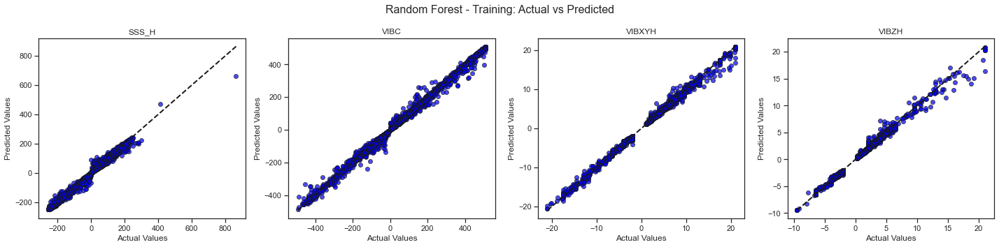

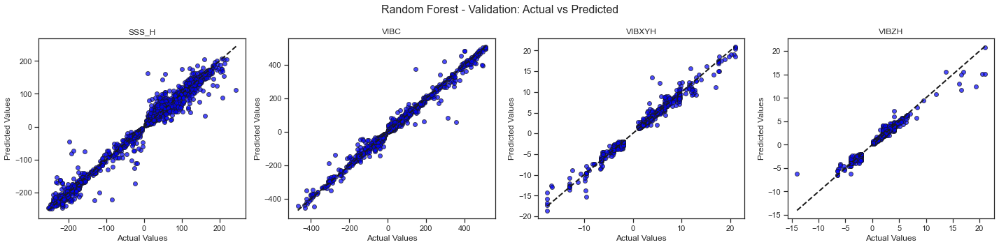

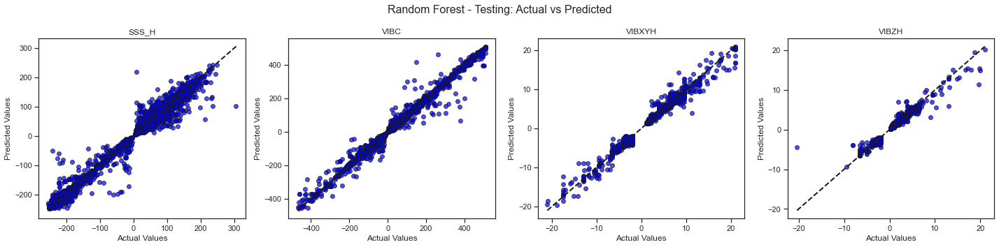

In [54]:
from sklearn.ensemble import RandomForestRegressor

# Specify the best hyperparameters for Random Forest
best_rf_hyperparameters = {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}

# Create the Random Forest model with the best hyperparameters
model = RandomForestRegressor(**best_rf_hyperparameters)

# Assuming you have y_train, y_val, y_test for each target column
y_train_all = np.array([y_train[col].values for col in target_columns]).T
y_val_all = np.array([y_val[col].values for col in target_columns]).T
y_test_all = np.array([y_test[col].values for col in target_columns]).T

# Fetch the description from the external dictionary (replace with your descriptions)
column_description = "Replace with your model description"

# Create the header with description
header = f"<div style='text-align: center; color: black; background-color: yellow; border: 2px solid #404040; padding: 2px; border-radius: 10px;'><h1>Random Forest</h1><p>{column_description}</p></div>"

# Display the header
display(Markdown(header))

# Fit the model
model.fit(x_train_scaled, y_train_all)

# Predictions on the training, validation, and testing data
y_pred_train = model.predict(x_train_scaled)
y_pred_val = model.predict(x_val_scaled)
y_pred_test = model.predict(x_test_scaled)

# Calculate accuracy values
train_accuracy = r2_score(y_train_all, y_pred_train)
val_accuracy = r2_score(y_val_all, y_pred_val)
test_accuracy = r2_score(y_test_all, y_pred_test)

train_mae = mean_absolute_error(y_train_all, y_pred_train)
val_mae = mean_absolute_error(y_val_all, y_pred_val)
test_mae = mean_absolute_error(y_test_all, y_pred_test)

# Display accuracy values
print("Training R-squared:", train_accuracy)
print("Validation R-squared:", val_accuracy)
print("Testing R-squared:", test_accuracy)

print("Training MAE:", train_mae)
print("Validation MAE:", val_mae)
print("Testing MAE:", test_mae)


# Visualize predictions for training, validation, and testing data
visualize_predictions(name, y_train_all, y_pred_train, 'Training', target_columns)
visualize_predictions(name, y_val_all, y_pred_val, 'Validation', target_columns)
visualize_predictions(name, y_test_all, y_pred_test, 'Testing', target_columns)


<div style="color:yellow;display:fill;border-radius:8px;
            background-color:#ffcc00;font-size:150%;
            font-family:Nexa;letter-spacing:0.5px">
    <p style="padding: 8px
;color:black;"><b> Deep Neutral Network </b></p>
</div>

Epoch 1/10
1123/1123 [==============================] - 5s 4ms/step - loss: 2847.4128 - mse: 2847.4128 - mae: 16.6513 - val_loss: 2520.8323 - val_mse: 2520.8323 - val_mae: 17.5854
Epoch 2/10
1123/1123 [==============================] - 4s 3ms/step - loss: 2264.6736 - mse: 2264.6738 - mae: 17.0086 - val_loss: 2297.7637 - val_mse: 2297.7637 - val_mae: 17.0274
Epoch 3/10
1123/1123 [==============================] - 4s 3ms/step - loss: 2043.4323 - mse: 2043.4323 - mae: 16.0413 - val_loss: 2063.8000 - val_mse: 2063.8000 - val_mae: 15.6465
Epoch 4/10
1123/1123 [==============================] - 3s 3ms/step - loss: 1811.9235 - mse: 1811.9235 - mae: 14.7718 - val_loss: 1831.1458 - val_mse: 1831.1458 - val_mae: 14.4753
Epoch 5/10
1123/1123 [==============================] - 4s 3ms/step - loss: 1585.0228 - mse: 1585.0228 - mae: 13.4737 - val_loss: 1608.3021 - val_mse: 1608.3021 - val_mae: 13.2821
Epoch 6/10
1123/1123 [==============================] - 4s 3ms/step - loss: 1402.1971 - mse: 1402.19

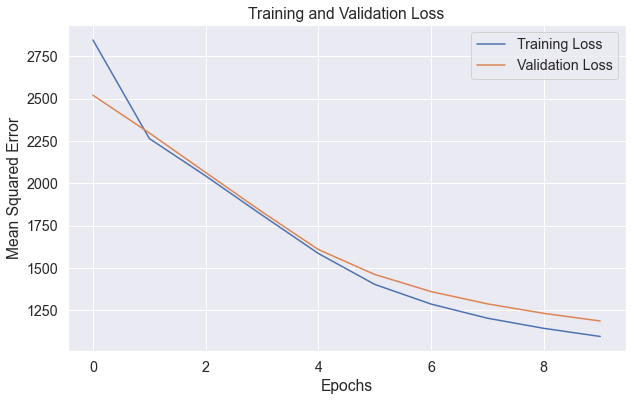

Mean Squared Error (MSE): 1185.9268
R-squared Score: 0.7550


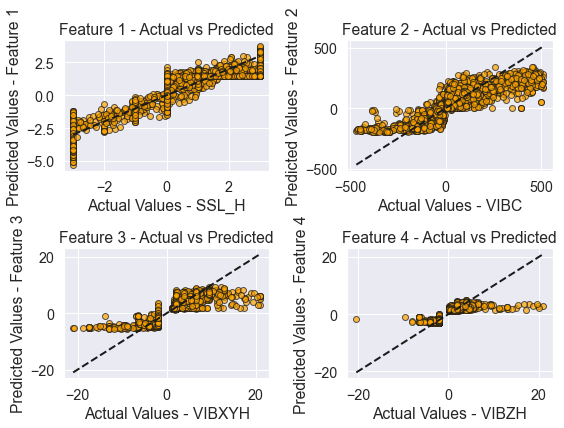

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2 (Dense)             (None, 14)                224       
                                                                 
 dense_3 (Dense)             (None, 4)                 60        
                                                                 
Total params: 284
Trainable params: 284
Non-trainable params: 0
_________________________________________________________________


In [27]:
from keras.models import Sequential
from keras.layers import Dense
import numpy as np
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Assuming x_train, y_train, x_test, y_test are already defined

# Initialize the ANN
model = Sequential()

# Adding the input layer and the first hidden layer
model.add(Dense(14, activation='relu', input_dim=x_train.shape[1]))

# Adding the output layer with 4 units for 4 features
model.add(Dense(units=4, activation='linear'))  # Adjust units to 4 for 4 output features

# Compiling the model
model.compile(loss='mean_squared_error',
              optimizer='adam',
              metrics=['mse', 'mae'])

# Fitting the ANN to the Training set
history = model.fit(x_train, y_train, epochs=10, batch_size=20, verbose=1, validation_data=(x_test, y_test))

# Evaluate the ANN on the test set
y_pred_nn = model.predict(x_test)
mse_nn = mean_squared_error(y_test, y_pred_nn)
r2_nn = r2_score(y_test, y_pred_nn)

# Visualize training history
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.show()

# Print the evaluation metrics
print(f'Mean Squared Error (MSE): {mse_nn:.4f}')
print(f'R-squared Score: {r2_nn:.4f}')

# Visualize predictions for the neural network
plt.figure(figsize=(8, 6))
for i, column in enumerate(y_test.columns):
    plt.subplot(2, 2, i + 1)
    plt.scatter(y_test[column], y_pred_nn[:, i], c='orange', edgecolors='k', alpha=0.7)
    plt.plot([y_test[column].min(), y_test[column].max()], [y_test[column].min(), y_test[column].max()], 'k--', lw=2)  # Ideal line
    plt.title(f'Feature {i+1} - Actual vs Predicted')
    plt.xlabel(f'Actual Values - {column}')
    plt.ylabel(f'Predicted Values - Feature {i+1}')

plt.tight_layout()
plt.show()

# Print the model summary
model.summary()


In [28]:
# Evaluate the ANN on the test set
y_pred_nn = model.predict(x_test)
r2_nn = r2_score(y_test, y_pred_nn)

# Print the R-squared score
print(f'R-squared Score: {r2_nn:.4f}')


176/176 [==============================] - 0s 2ms/step
R-squared Score: 0.7550


# <b><span style='color:#0000FF'></span> Final Model </b>

In [12]:
model

RandomForestRegressor()

# <b>10 <span style='color:#0000FF'>|</span> Deployment </b>

In [36]:
# save the model
joblib.dump(model, 'models/model.h5') 

['models/model.h5']

In [37]:
# save the scaler
joblib.dump(scaler, 'models/scaler.h5') 

['models/scaler.h5']